# Challenge 1 - Data Science: Alura Stores

## Indice

1. Descripción del proyecto
2. Importación de librerías iniciales y extracción de datos (ETL)
3. Funciones
4. EDA *(Exploratory Data Analysis)*
5. Data Analysis:
   - Analisis de facturacion
   - Ventas por categoría
   - Calificación promedio de la tienda
   - Productos más y menos vendidos
   - Costo promedio de envío por tienda
       - Análisis Geográfico de Ventas
6. Análisis Geoespacial  
7. Conclusiones y recomendación

## 1. Descripción del proyecto

A continuación se realizará un analisis de datos proveninentes de 4 tiendas de la compañía **"Alura Stores"** con el objetivo de evaluar cual de ellas presenta menor rendimiento y proceder con la venta de la misma para utilizar el dinero en una nueva inversión.<br>
Para determinar esto, se evaluarán distintos aspectos de cada una de las tiendas, ya que diversos factores intervienen a la hora de diagnosticar el rendimiento de cada una de ellas. <br>
Para esto se analizará cada tienda de manera individual para su posterior comparación:
* Facturación
* Ventas por categoría de producto
* Calificación promedia efectuada por los clientes
* Menor y mayor volumen de productos vendidos
* Costo de envío promedio
<br>

*Nota: Se proporcionará visualización de los datos analizados para fácil interpretación de los mismos.*

Una vez finalizado el análisis, se proporcionará un informe detallado con las conclsiones resultantes y la recomendación final justificada.

## 2. Importación de librerías iniciales y extracción de datos (ETL)

### Importación de librerías iniciales

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from typing import Callable, List, Dict
from sklearn.cluster import KMeans
import folium
from folium.plugins import MarkerCluster, HeatMap
sns.set()

#### Versiones de las librerías

In [2]:
import sys
print(f'python=={sys.version_info.major}.{sys.version_info.minor}.{sys.version_info.micro}')
print(f'numpy=={np.__version__}')
print(f'pandas=={pd.__version__}')
import matplotlib
print(f'matplotlib=={matplotlib.__version__}')
print(f'seaborn=={sns.__version__}')
print(f'folium=={folium.__version__}')
import sklearn
print(f'scikit-learn=={sklearn.__version__}')

python==3.11.7
numpy==1.26.4
pandas==2.2.2
matplotlib==3.10.0
seaborn==0.13.2
folium==0.19.5
scikit-learn==1.5.2


### Extracción de datos (ETL)

In [3]:
# Leer los archivos .csv y almacenar su contenido en formato DataFrame, utilizando una variable por archivo (tienda).
df_tienda1 = pd.read_csv('tienda_1.csv')
df_tienda2 = pd.read_csv('tienda_2.csv')
df_tienda3 = pd.read_csv('tienda_3.csv')
df_tienda4 = pd.read_csv('tienda_4.csv')

## 3. Funciones

In [4]:
def crear_boxplot(df: pd.DataFrame, 
                  columna: str, 
                  orientacion: str='h',
                  titulo: str=None):
    """
    Esta función esta diseñada para generar un boxplot para mostrar la distribución de los datos de una columna de un DataFrame
    -----------------------------------------------------------
    Parámetros:
        df: pd.DataFrame
            DataFrame que se quiere explorar
        columna: str
            Columna sobre la cual queremos visualizar la distribución de los datos
        orientacion: str
            Valor por defecto = h: el gráfico estará ubicado horizontalmente
            En caso de querer visualizarlo de forma vertical: orientacion='v'
        titulo: str
            Titulo que deseamos darle al gráfico
    -----------------------------------------------------------
    Returns:
        Boxplot para visualización de distribución de datos
    """
    # Generar el gráfico de bigotes
    sns.boxplot(df[columna], orient=orientacion)
    # Establecer título del gráfico
    plt.title(titulo if titulo else f'Boxplot: {columna}')

    return plt.show()

In [5]:
def crear_barplot(df: pd.DataFrame, 
                  columna1: str,
                  plot_size: tuple=(8,6),
                  ax=None,
                  titulo: str=None, 
                  xlabel: str=None, 
                  ylabel: str=None, 
                  xlabel_rotation: int=None, 
                  ha: str='center', 
                  ylim: int=None, 
                  mostrar_valores: bool=False):

    """
    Esta función esta diseñada para generar un gráfico de barras que contabiliza la frecuencia de los datos de una columna de un DataFrame
    -----------------------------------------------------------
    Parámetros:
        df: pd.DataFrame
            DataFrame de donde se obtendrán los datos
        columna: str
            Columna sobre la cual queremos contar la frecuencia de valores
        plot_size: tuple
            Tupla que contiene ancho y alto de la figura
        ax: Axes
            Objeto de matplotlib que determina la distribucion del gráfico en la figura
        titulo: str
            Titulo del gráfico
        xlabel: str
            Etiqueta del eje de las abscisas
                En caso de no definir, se utilizará el nombre de la columna analizada
        ylabel: str
            Etiqueta del eje de las ordenadas
                En caso de no definir, se utilizará 'Frecuencia'
        xlabel_rotation: int
            Grados por los cuales se quiere rotar las etiquetas del eje de las abscisas (valores únicos de la columna analizada)
                Por defecto no se rotarán las etiquetas
        ha: str
            Ubicación de las etiquetas en relación a las barras. Valores válidos = 'left', 'center', 'right'
                Por defecto se ubicarán en 'center'
        ylim: int
            Límite superior del eje de las ordenadas
                Por defecto no tiene límite
        mostrar_valores: bool
            Etiquetas con los valores de frecuencia de cada barra ubicados en la parte superior de cada una de ellas.
                Por defecto establecido en False, definir en True para mostrar
    -----------------------------------------------------------
    Returns:
        Gráfico de línea para visualización de series temporales
    """
        
    # Generar DataFrame con valores unicos en la columna indicada y su frecuencia
    datos = df[columna1].value_counts().reset_index()
    # Establecer el nombre de las columnas del nuevo DataFrame
    datos.columns = [columna1, 'Frecuencia']


    # Si no se ha pasado un axis para el grafico, se crea (esto permitirá utilizar esta función dentro de otra)
    if ax is None:
        fig, ax = plt.subplots(figsize=plot_size)
    
    # Generar el grafico de barras
    sns.barplot(
        # Indicar la fuente de datos para crear el gráfico
        data=datos,
        # Indicar la columna que corresponde al eje de las abscisas
        x = columna1,
        # Indicar la columna que corresponde al eje de las ordenadas
        y = 'Frecuencia',
        # Indicar parametro para diferenciar los colores del gráfico (aqui cada etiqueta tendrá un valor
        hue=columna1,
        # Indicar la paleta de colores que se quiere utilizar en el gráfico
        palette='colorblind',
        # Indicar que no se debe mostrar la leyenda ya que ya estan las etiquetas en el eje x
        legend=False,
        # Indicar el axis en el que debe ser dibujada la figura)
        ax=ax)

    # Confirugrar el titulo del gráfico
    ax.set_title(titulo if titulo else f'Frecuencia de {columna1}')
    # Configurar la etiqueta del eje de las abscisas
    ax.set_xlabel(xlabel if xlabel else columna1)
    # Configurar la etiqueta del eje de las ordenadas
    ax.set_ylabel(ylabel if ylabel else 'Frecuencia')

    # Validar si se ha declarado el argumento ylim
    if ylim:
        # Establecer el límite superior del eje de las ordenadas
        ax.set_ylim(0, ylim)

    # Validar si se ha declarado el argumento para rotación de las etiquetas del eje de las abscisas
    if xlabel_rotation:
        x_ticks = datos[columna1]
        # Rotar las etiquetas del eje de las abscisas
        ax.set_xticks(x_ticks, labels=x_ticks,rotation=xlabel_rotation, ha=ha)

    # Validar si se ha declarado el argumento para mostrar el valor de cada barra
    if mostrar_valores:
        # Iterar sobre cada barra del gráfico que se ha almacenado el la variable ax
        for bar in ax.patches:
            # Obtener la altura de la barra (frecuencia)
            altura = bar.get_height()
            # Función para escribir sobre la figura
            ax.text(
                # Obtener el punto de iniciación de la barra y su ancho y luego dividir por 2 para ubicar la etiqueta en el centro
                bar.get_x() + bar.get_width() / 2,
                # agregar pixeles a la altura de la barra para separar el texto
                altura + 15,
                # convertir el valor en integer
                f'{round(altura):,.0f}',
                # Centrar la etiqueta
                ha='center',
                # Configurar el tamaño de la letra de la etiqueta
                fontsize=12)

    # Retornar la figura
    return ax

In [6]:
def serie_temporal(df: pd.DataFrame,
                   columna_fecha: str,
                   columna_valores: str,
                   plot_size: tuple=(8, 6),
                   ax=None,
                   titulo: str=None,
                   xlabel: str=None,
                   ylabel: str=None,
                   ylim: int=None,
                   xlabel_rotation: int=None,
                   mostrar_valores: bool=False):

    """
    Esta función esta diseñada para generar un serie temporal(grafico de línea) que muestra la evolución de una variable numérica en un período de
    tiempo determinado.
    -----------------------------------------------------------
    Parámetros:
        df: pd.DataFrame
            DataFrame de donde se obtendrán los datos
        columna_fecha: str
            Columna que contiene la variable de tiempo (eje de las abscisas)
        columna_valores: str
            Columna de la cual queremos analizar la evolución
        plot_size: tuple
            Tupla que contiene ancho y alto de la figura
        ax: Axes
            Objeto de matplotlib que determina la distribucion del gráfico en la figura
        titulo: str
            Titulo del gráfico
        xlabel: str
            Etiqueta del eje de las abscisas
                En caso de no definir, se utilizará el nombre de la columna analizada
        ylabel: str
            Etiqueta del eje de las ordenadas
                En caso de no definir, se utilizará 'Frecuencia'
        xlabel_rotation: int
            Grados por los cuales se quiere rotar las etiquetas del eje de las abscisas
                Por defecto no se rotarán las etiquetas
        ylim: int
            Límite superior del eje de las ordenadas
                Por defecto no tiene límite
        mostrar_valores: bool
            Etiquetas con los valores de frecuencia de cada barra ubicados en la parte superior de cada una de ellas.
                Por defecto establecido en False, definir en True para mostrar
    -----------------------------------------------------------
    Returns:
        Gráfico de barras para visualización de frecuencia de datos
    """
    # Si no existe posición en el eje (subplots), lo creamos
    if ax is None:
        fig, ax = plt.subplots(figsize=plot_size)

    # Dibujar el grafico con las columnas indicadas, y colocar un punto en cada tick de las abscisas
    ax.plot(df[columna_fecha], df[columna_valores], marker='o')
    
    # Título y etiquetas del gráfico
    ax.set_title(titulo if titulo else f'Serie Temporal {columna_valores}')
    ax.set_xlabel(xlabel if xlabel else f'{columna_fecha}')
    ax.set_ylabel(ylabel if ylabel else f'{columna_valores}')

    # Si la función ha recibido limite de las ordenadas, configurarlo
    if ylim:
        ax.set_ylim(0, ylim)

    # Eliminar etiquetas de las abscisas
    ax.set_xticklabels([])

    # Retornar el gráfico
    return ax

In [7]:
def crear_piechart(df: pd.DataFrame,
                  columna1: str,
                  columna2: str,
                  plot_size: tuple=(8, 6),
                  ax=None,
                  titulo: str=None,
                  xlabel_rotation: int=None):

    """
    Esta función esta diseñada para generar un gráfico de barras que contabiliza la frecuencia de los datos de una columna de un DataFrame
    -----------------------------------------------------------
    Parámetros:
        df: pd.DataFrame
            DataFrame de donde se obtendrán los datos
        columna1: str
            Columna sobre la cual queremos agrupar de valores
        columna2: str
            Columna sobre la cual queremos contabilizar
        plot_size: tuple
            Tupla que contiene ancho y alto de la figura
        ax: Axes
            Objeto de matplotlib que determina la distribucion del gráfico en la figura
        titulo: str
            Titulo del gráfico
        xlabel_rotation: int
            Grados por los cuales se quiere rotar las etiquetas del eje de las abscisas (valores únicos de la columna analizada)
                Por defecto no se rotarán las etiquetas

    -----------------------------------------------------------
    Returns:
        Gráfico de torta (Pie Chart) para visualización de proporciones
    """

    # Generar DataFrame con valores unicos en la columna indicada y su frecuencia
    datos = df.groupby(columna1)[columna2].sum().reset_index()
    # Establecer el nombre de las columnas del nuevo DataFrame
    datos.columns = [columna1, 'Sumatoria']
    # Agregar columna con el porcentaje de cada categoría
    total = sum(datos['Sumatoria'])
    datos['Porcentaje'] = datos['Sumatoria'].apply(lambda row: f'{round(row / total * 100):.2f}%')

    # Si no se ha pasado un axis para el grafico, se crea (esto permitirá utilizar esta función dentro de otra)
    if ax is None:
        fig, ax = plt.subplots(figsize=plot_size)

    # Crear una paleta de colores con seaborn
    colors = sns.color_palette("colorblind", len(datos))  # Puedes elegir cualquier paleta de seaborn
    
    # Generar el pie chart
    wedges, texts = ax.pie(
                            # Indicar la fuente de datos para crear el gráfico
                            datos['Sumatoria'],
                            # Establecer etiquetas
                            labels=datos['Porcentaje'],
                            # Establecer colores de los slices
                            colors=colors,
                            # Ajusta la distancia de las etiquetas respecto a las porciones
                            labeldistance=1.1  
                           )
    
    # Si la función ha recibido parámetro de rotación de las etiquetas, configurarlo
    if xlabel_rotation:
        for text in texts:
            text.set_rotation(xlabel_rotation)
                                        
    # Configurar la leyenda del gráfico
    ax.legend(labels=datos[columna1], loc="upper left", bbox_to_anchor=(1, 1), title=columna1)
    # Configurar el título del gráfico
    ax.set_title(titulo if titulo else f'Pie Chart {columna1}')

    # Retornar el gráfico
    return ax

In [8]:
def graficos_comparacion(df_list: List[pd.DataFrame],
                         grafico: Callable,
                         columna_1: str,
                         columna_2: str=None,
                         super_title: str=None,
                         figsize: tuple=(12, 12),
                         ylim: int=None,
                         xlabel_rotation: int=None,
                         mostrar_valores: bool=False,
                        ):
                         

    """
    Esta función esta diseñada para crear una figura con subplots para visualizar y comprar estadísticas de las 4 tiendas en una única visualización
    -----------------------------------------------------------------------------------------------------------------------------
    Parámetros:
        df_list: list
            Lista que contenga los DataFrames a comparar
        grafico: Callable
            Función que cree un gráfico por DataFrame
        columna1: str
            Columna sobre la cual queremos agrupar de valores
        columna2: str
            Columna sobre la cual queremos contabilizar
        super_title: str
            Titulo del gráfico de comparación    
        fig_size: tuple
            Tupla que contiene ancho y alto de la figura (gráfico de comparación)
        ylim: int
            Limite del eje de las ordenadas para todos los subgráficos
        xlabel_rotation: int
            Grados por los cuales se quiere rotar las etiquetas del eje de las abscisas (valores únicos de la columna analizada)
            Tambien utilizado para girar las etiquetas en 'Pie Chart'
                Por defecto no se rotarán las etiquetas
        mostrar_valores: bool
            Utilizado en crear_barplot para mostrar los valores en la parte superior de las barras
    -----------------------------------------------------------
    Returns:
        Gráfico con subplots de comparación para cada df pasado como parametro en df_list
    """

    # Calcular la cantidad de filas que tendrá la figura (está pensado para 2 columnas)
    rows = int(np.floor(len(df_list)/2))
    # Calcular la cantidad de columnas que tendrá la figura
    columns = int(np.ceil(len(df_list)/rows))

    # Definir la figura y cantidad de sub plots
    fig, axes = plt.subplots(rows, columns, figsize=figsize)

    # Definir el titulo de la figura principal (comparación que se está haciendo)
    fig.suptitle(super_title if super_title else 'Comparación Tiendas')

    # Iterar sobre la lista de DataFrames, obteniendo el indice y el DataFrame a trabajar
    for idx, df in enumerate(df_list):
        
        # Obtener la fila y columna en la cual debe ir el grafico de la iteración actual
        row = idx // columns # la división entera devuelve cuantas filas se llenaron
        col = idx % columns # la división modular se reiniciará a 0 cuando se completen las columnas de una fila

        # Seleccionar donde debe ir la figura, si hay solo una fila, se utilizará solo el valor de la columna
        ax = axes[row, col] if rows > 1 else axes[col]

        # Configurar el titulo del subplot utilizando el indice de iteración
        sub_titulo = f'Tienda {idx+1}'

        # Generar el sub plot utilizando la funcion pasada como argumento (Callable) y validando si se necesita más de una columna para graficar
        if grafico == crear_barplot:
            grafico(df, columna_1, ax=ax, plot_size=(6,4),titulo=sub_titulo, 
                    ylim=ylim, xlabel_rotation=xlabel_rotation, mostrar_valores=mostrar_valores)
        elif grafico == serie_temporal:
            grafico(df, columna_1, columna_2, ax=ax, plot_size=(6,4), titulo=sub_titulo, 
                    ylim=ylim, xlabel_rotation=xlabel_rotation,mostrar_valores=mostrar_valores)
        elif grafico == crear_piechart:
            grafico(df, columna_1, columna_2, plot_size=(9,7), titulo=sub_titulo,
                    xlabel_rotation=xlabel_rotation, ax=ax)
            
        
    # Ajustar la presentación de la figura principal
    plt.tight_layout()
    # Mostrar el gráfico
    plt.show()

In [9]:
def folium_map(df: pd.DataFrame,
               columna_lat: str='lat',
               columna_lon: str='lon',
               columna_etiqueta: str='Tienda',
               tipo: str='marker',
               columnas: List=None,
               diccionario_colores: Dict=None):
    """
    Esta función esta diseñada para crear mapas interactivos de dos tipos: Markers (marcadores individuales) y Heatmaps (mapas de calor).
    -------------------------------------------------------------------------------------------------
    Parámetros:
        df: pd.DataFrame
            DataFrame que se busca representar en el mapa (debe contener dos columnas separadas con valores de latitud y longitud).
        columna_lat: str
            Nombre de la columna con los valores de latitud.
                Por defecto: 'lat'
        columna_lon: str
            Nombre de la columna con los valores de longitud.
                Por defecto: 'lon'
        columna_etiqueta: str
            Nombre de la columna que contiene la etiqueta del registro
                Por defecto: 'Tienda'
        tipo: str
            Admite solo dos valores: 'marker' o 'heatmap' para determinar el tipo de mapa a crear.
                Toma valor 'marker' por defecto.
        columnas: List
            Lista de columnas que se desea mapear.
                En el caso de heatmap solo se tomará la primera columna.
        diccionario_colores: Dict
            Diccionario que contiene los colores para cada marcador. La clave debe ser un str que corresponda a la etiqueta
            a la cual queremos aplicar el color.
    -------------------------------------------------------------------------------------------------
    Returns:
        Mapa con el análisis establecido e información correspondiente contenida en el DataFrame
    """

    # Obtener el valor promedio de latitud y longitud para centrar el mapa
    center_lat = df[columna_lat].mean()
    center_lon = df[columna_lon].mean()

    # Crear el objeto con el mapa
    m = folium.Map(location=[center_lat, center_lon], zoom_start=6)
    
    # Validar tipo de mapa deseado
    if tipo == 'marker':

        # Generar el objeto que contendrá la agrupación de los marcadores
        cluster = MarkerCluster().add_to(m)

        # Iterar sobre cada fila del DataFrame (en este caso "_" es utilizado para ignorar el indice, ya que no se utiliza)
        for _, row in df.iterrows():

            # Buscar en el diccionario pasado como argumento el color correspondiente a la etiqueta de la fila en la iteración actual
            color = diccionario_colores.get(row[columna_etiqueta], 'gray')
            # Guardar la información que contendra el marcador, correspondiente a la etiqueta y las columnas pasadas como argumentos
            popup_info = f'<b>{row[columna_etiqueta]}</b><br>' + '<br>'.join([f'{col}: {row[col]}' for col in columnas])
            # Configurar el marcador
            folium.Marker(
                # Ubicación
                location = [row[columna_lat], row[columna_lon]],
                # Información
                popup=popup_info,
                # Color
                icon=folium.Icon(color=color)).add_to(cluster) # Agregar el marcador al cluster

    # Validar tipo de mapa deseado
    elif tipo == 'heatmap':
        # Validar si existe una columna para determinar la intensidad del heatmap en vez de utilizar la frecuencia de registros
        if columnas:
            # Obtener el primer elemento de la lista de columnas pasada como argumento (heatmap permite solo una)
            col = columnas[0]

            # Obtener valores minimo y máximos para escalar los valores
            min_val = df[col].min()
            max_val = df[col].max()

            # Agregar una columna con el valor estandarizado para regular la intensidad
            df['Intensidad'] = df[col].apply(lambda x: (x - min_val) / (max_val - min_val) if pd.notnull(x) else 0)
            # Definir los valores utilizados para el mapa de calor, ubicación e valor escalado
            heat_data = [[row[columna_lat], row[columna_lon], row['Intensidad']] for _, row in df.iterrows()]
            # Mapear los datos y agregarlos a la figura del mapa
            HeatMap(heat_data).add_to(m)
        else:
            # Definir la ubicación y los valores del mapa de calor
            heat_data = df[[columna_lat, columna_lon]].dropna().values.tolist()
            # Mapear los datos y agregarlos a la figura del mapa
            HeatMap(heat_data).add_to(m)
        
    else:
        # Error en caso de recibir un tipo de mapa no contemplado en la función
        raise ValueError('Tipo de mapa no reconocido en esta función. Utilice "marker" o "heatmap"')
    
    # Retornar el mapa    
    return m

## 4. Analisis Exploratorio de Datos (EDA)

#### Tienda 1

In [10]:
# Observar la estructura del DataFrame
df_tienda1.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,164300.0,6900.0,16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175
1,Mesa de comedor,Muebles,192300.0,8400.0,18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359
2,Juego de mesa,Juguetes,209600.0,15900.0,15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444
3,Microondas,Electrodomésticos,757500.0,41000.0,03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250
4,Silla de oficina,Muebles,335200.0,20200.0,07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359


In [11]:
# Información sobre columnas, cantidad de registros, valores nulos y tipos de datos
df_tienda1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2359 entries, 0 to 2358
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Producto                2359 non-null   object 
 1   Categoría del Producto  2359 non-null   object 
 2   Precio                  2359 non-null   float64
 3   Costo de envío          2359 non-null   float64
 4   Fecha de Compra         2359 non-null   object 
 5   Vendedor                2359 non-null   object 
 6   Lugar de Compra         2359 non-null   object 
 7   Calificación            2359 non-null   int64  
 8   Método de pago          2359 non-null   object 
 9   Cantidad de cuotas      2359 non-null   int64  
 10  lat                     2359 non-null   float64
 11  lon                     2359 non-null   float64
dtypes: float64(4), int64(2), object(6)
memory usage: 221.3+ KB


In [12]:
# Resumen de estadísticas descriptivas de variables numéricas
df_tienda1.describe()

,Precio,Costo de envío,Calificación,Cantidad de cuotas,lat,lon
count,2.359000e+03,2359.000000,2359.000000,2359.000000,2359.000000,2359.000000
mean,4.878679e+05,26018.609580,3.976685,2.943196,5.365283,-74.789417
std,6.146868e+05,32860.001783,1.415370,2.819897,2.287445,1.217827
min,7.600000e+03,0.000000,1.000000,1.000000,-4.215280,-77.281110
25%,5.575000e+04,3100.000000,3.000000,1.000000,4.609710,-75.563590
50%,2.353000e+05,12400.000000,5.000000,1.000000,4.609710,-74.199040
75%,6.781000e+05,36000.000000,5.000000,4.000000,6.251840,-74.081750
max,2.977000e+06,160800.000000,5.000000,24.000000,11.544440,-67.923900


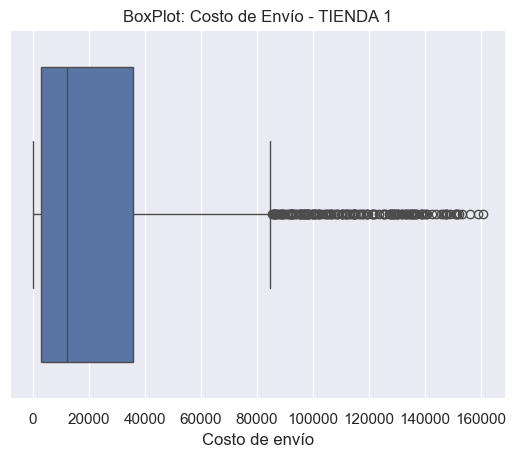

In [13]:
crear_boxplot(df_tienda1, 'Costo de envío', titulo='BoxPlot: Costo de Envío - TIENDA 1')

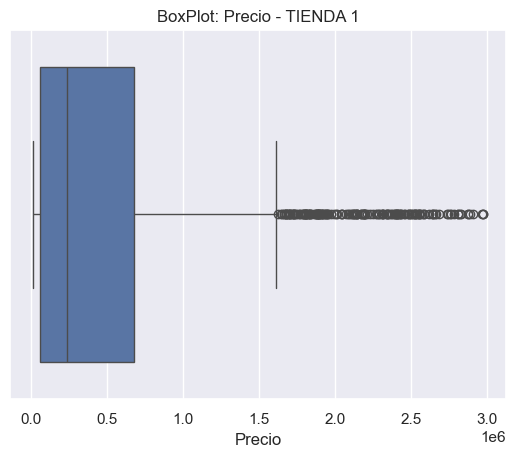

In [14]:
crear_boxplot(df_tienda1, 'Precio', titulo='BoxPlot: Precio - TIENDA 1')

#### Tienda 2

In [15]:
df_tienda2.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Silla de oficina,Muebles,283600.0,15300.0,04/08/2021,Izabela de León,Medellín,1,Nequi,1,6.25184,-75.56359
1,Pandereta,Instrumentos musicales,76800.0,2300.0,26/11/2020,Blanca Ramirez,Medellín,3,Tarjeta de crédito,4,6.25184,-75.56359
2,Cama king,Muebles,443300.0,23800.0,22/10/2021,Izabela de León,Pereira,5,Tarjeta de crédito,10,4.81333,-75.69611
3,Cama king,Muebles,906200.0,46400.0,04/05/2022,Maria Alfonso,Cali,5,Tarjeta de crédito,10,3.43722,-76.52250
4,Silla de oficina,Muebles,397800.0,19400.0,26/02/2022,Lucas Olivera,Bogotá,4,Tarjeta de crédito,3,4.60971,-74.08175


In [16]:
# Información sobre columnas, cantidad de registros, valores nulos y tipos de datos
df_tienda2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2359 entries, 0 to 2358
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Producto                2359 non-null   object 
 1   Categoría del Producto  2359 non-null   object 
 2   Precio                  2359 non-null   float64
 3   Costo de envío          2359 non-null   float64
 4   Fecha de Compra         2359 non-null   object 
 5   Vendedor                2359 non-null   object 
 6   Lugar de Compra         2359 non-null   object 
 7   Calificación            2359 non-null   int64  
 8   Método de pago          2359 non-null   object 
 9   Cantidad de cuotas      2359 non-null   int64  
 10  lat                     2359 non-null   float64
 11  lon                     2359 non-null   float64
dtypes: float64(4), int64(2), object(6)
memory usage: 221.3+ KB


In [17]:
# Resumen de estadísticas descriptivas de variables numéricas
df_tienda2.describe()

,Precio,Costo de envío,Calificación,Cantidad de cuotas,lat,lon
count,2.359000e+03,2359.000000,2359.000000,2359.000000,2359.000000,2359.000000
mean,4.732274e+05,25216.235693,4.037304,2.902501,5.499753,-74.742963
std,5.955595e+05,31741.375166,1.356153,2.848416,2.351118,1.185997
min,7.600000e+03,0.000000,1.000000,1.000000,-4.215280,-77.281110
25%,5.455000e+04,2900.000000,4.000000,1.000000,4.609710,-75.563590
50%,2.182000e+05,11600.000000,5.000000,1.000000,4.609710,-74.199040
75%,6.777000e+05,35450.000000,5.000000,4.000000,6.251840,-74.081750
max,2.953400e+06,162500.000000,5.000000,24.000000,11.544440,-67.923900


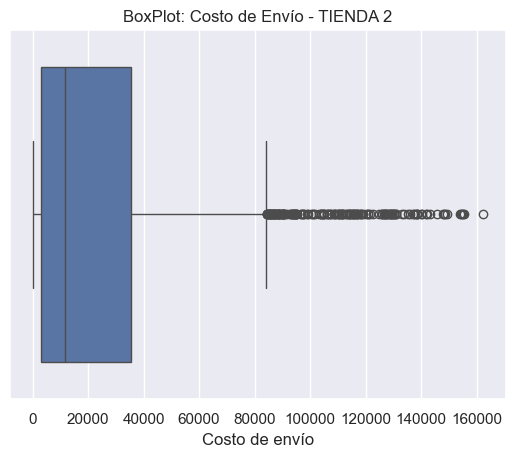

In [18]:
crear_boxplot(df_tienda2, 'Costo de envío', titulo='BoxPlot: Costo de Envío - TIENDA 2')

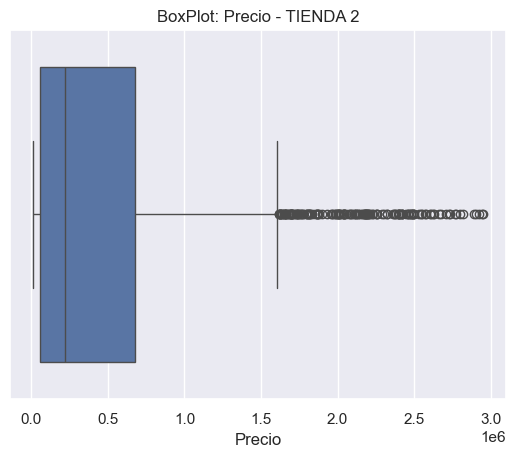

In [19]:
crear_boxplot(df_tienda2, 'Precio', titulo='BoxPlot: Precio - TIENDA 2')

#### Tienda 3

In [20]:
df_tienda3.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Secadora de ropa,Electrodomésticos,1285100.0,66600.0,17/12/2021,Camila Rivera,Santa Marta,4,Tarjeta de crédito,4,11.24079,-74.19904
1,Mesa de noche,Muebles,290100.0,13600.0,10/02/2021,Maria Alfonso,Cali,3,Tarjeta de crédito,1,3.43722,-76.52250
2,Guitarra acústica,Instrumentos musicales,303500.0,17400.0,22/01/2023,Lucas Olivera,Bogotá,5,Tarjeta de crédito,3,4.60971,-74.08175
3,Balón de voleibol,Deportes y diversión,58800.0,3300.0,22/03/2022,Pedro Gomez,Barranquilla,4,Tarjeta de crédito,6,10.96854,-74.78132
4,Armario,Muebles,521100.0,25900.0,12/01/2022,Blanca Ramirez,Bogotá,1,Tarjeta de crédito,1,4.60971,-74.08175


In [21]:
# Información sobre columnas, cantidad de registros, valores nulos y tipos de datos
df_tienda3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2359 entries, 0 to 2358
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Producto                2359 non-null   object 
 1   Categoría del Producto  2359 non-null   object 
 2   Precio                  2359 non-null   float64
 3   Costo de envío          2359 non-null   float64
 4   Fecha de Compra         2359 non-null   object 
 5   Vendedor                2359 non-null   object 
 6   Lugar de Compra         2359 non-null   object 
 7   Calificación            2359 non-null   int64  
 8   Método de pago          2359 non-null   object 
 9   Cantidad de cuotas      2359 non-null   int64  
 10  lat                     2359 non-null   float64
 11  lon                     2359 non-null   float64
dtypes: float64(4), int64(2), object(6)
memory usage: 221.3+ KB


In [22]:
# Resumen de estadísticas descriptivas de variables numéricas
df_tienda3.describe()

,Precio,Costo de envío,Calificación,Cantidad de cuotas,lat,lon
count,2.359000e+03,2359.000000,2359.000000,2359.000000,2359.000000,2359.000000
mean,4.654598e+05,24805.680373,4.048326,2.967783,5.437076,-74.733463
std,5.806434e+05,30945.889626,1.386426,2.812153,2.405272,1.224572
min,7.600000e+03,0.000000,1.000000,1.000000,-4.215280,-77.281110
25%,5.740000e+04,3100.000000,4.000000,1.000000,4.609710,-75.563590
50%,2.263000e+05,11900.000000,5.000000,2.000000,4.609710,-74.199040
75%,6.660500e+05,34950.000000,5.000000,4.000000,6.251840,-74.081750
max,2.968200e+06,158400.000000,5.000000,24.000000,11.544440,-67.923900


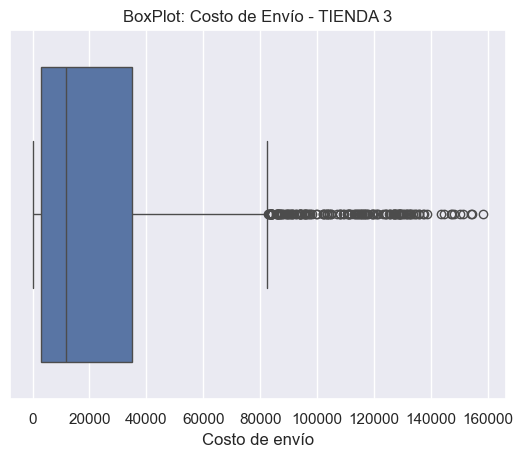

In [23]:
crear_boxplot(df_tienda3, 'Costo de envío', titulo='BoxPlot: Costo de Envío - TIENDA 3')

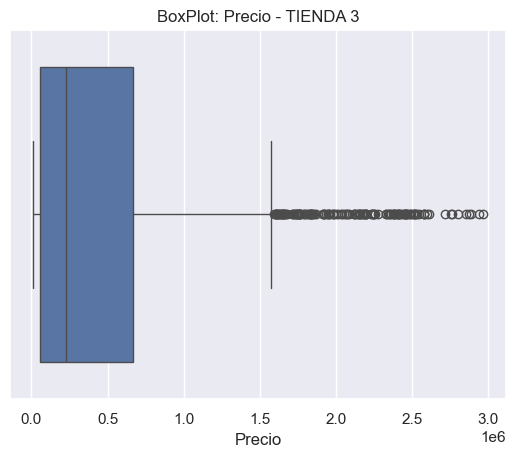

In [24]:
crear_boxplot(df_tienda3, 'Precio', titulo='BoxPlot: Precio - TIENDA 3')

#### Tienda 4

In [25]:
df_tienda4.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Lavavajillas,Electrodomésticos,1084800.0,56000.0,11/11/2022,Rafael Acosta,Bogotá,4,Tarjeta de crédito,3,4.60971,-74.08175
1,Cama box,Muebles,473800.0,25400.0,03/01/2020,Izabela de León,Cúcuta,5,Tarjeta de crédito,2,7.89391,-72.50782
2,Balón de baloncesto,Deportes y diversión,23700.0,0.0,25/12/2022,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359
3,Modelado predictivo,Libros,57700.0,1300.0,23/11/2021,Lucas Olivera,Medellín,3,Nequi,1,6.25184,-75.56359
4,Auriculares,Electrónicos,138900.0,5600.0,25/04/2022,Blanca Ramirez,Bogotá,4,Tarjeta de crédito,7,4.60971,-74.08175


In [26]:
# Información sobre columnas, cantidad de registros, valores nulos y tipos de datos
df_tienda4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2358 entries, 0 to 2357
Data columns (total 12 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Producto                2358 non-null   object 
 1   Categoría del Producto  2358 non-null   object 
 2   Precio                  2358 non-null   float64
 3   Costo de envío          2358 non-null   float64
 4   Fecha de Compra         2358 non-null   object 
 5   Vendedor                2358 non-null   object 
 6   Lugar de Compra         2358 non-null   object 
 7   Calificación            2358 non-null   int64  
 8   Método de pago          2358 non-null   object 
 9   Cantidad de cuotas      2358 non-null   int64  
 10  lat                     2358 non-null   float64
 11  lon                     2358 non-null   float64
dtypes: float64(4), int64(2), object(6)
memory usage: 221.2+ KB


In [27]:
# Resumen de estadísticas descriptivas de variables numéricas
df_tienda4.describe()

,Precio,Costo de envío,Calificación,Cantidad de cuotas,lat,lon
count,2.358000e+03,2358.000000,2358.000000,2358.000000,2358.000000,2358.000000
mean,4.403629e+05,23459.457167,3.995759,2.896098,5.413519,-74.774597
std,5.687556e+05,30279.100836,1.403063,2.730393,2.376728,1.199749
min,7.600000e+03,0.000000,1.000000,1.000000,-4.215280,-77.281110
25%,5.340000e+04,2900.000000,3.000000,1.000000,4.609710,-75.563590
50%,2.094500e+05,10950.000000,5.000000,1.000000,4.609710,-74.199040
75%,6.342250e+05,33300.000000,5.000000,4.000000,6.251840,-74.081750
max,2.902200e+06,154700.000000,5.000000,18.000000,11.544440,-67.923900


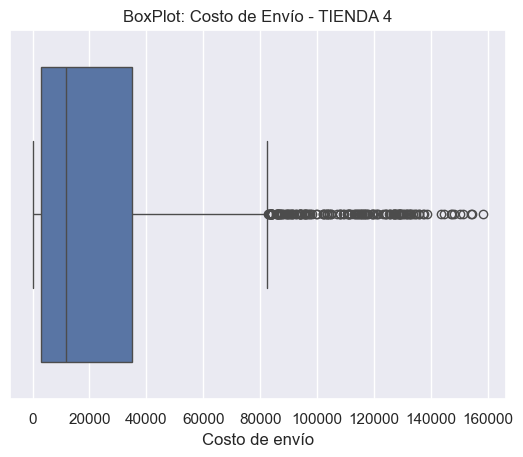

In [28]:
crear_boxplot(df_tienda3, 'Costo de envío', titulo='BoxPlot: Costo de Envío - TIENDA 4')

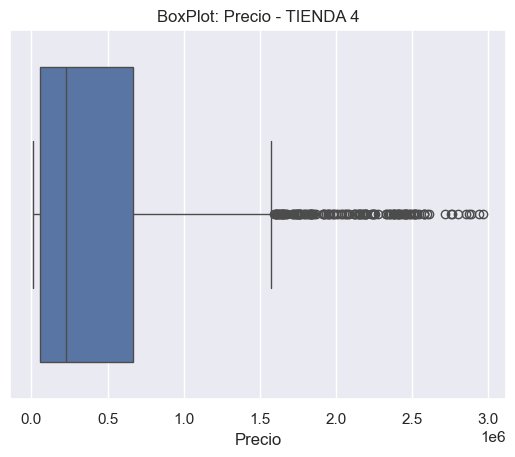

In [29]:
crear_boxplot(df_tienda3, 'Precio', titulo='BoxPlot: Precio - TIENDA 4')

### Observaciones: Análisis Exploratorio de Datos

Algunas apreciaciones que podemos obtener inicialmente son las siguientes:

* Ninguno de los datasets presentan valores nulos.
* Los datasets están balanceados, es decir, tenemos la misma cantidad de registros para cada uno de ellos (excepto Tienda 4 que tiene 1 registro menos, lo cual es insignificante para este tipo de análisis.
* Existen muchos registros por encima del ***percentil 97.5*** tanto en 'Costo de envío' como en 'Precio'. Estos, podrían ser interpretados como outliers, o también describir que tanto la cobertura geográfica de las tiendas como la variedad de productos es amplia, lo cual genera una dispersión natural de los datos. Algunos análisis para explicar esto:
  - En 'Costo de envío', podemos suponer que las tiendas distribuyen a una gran variedad de clientes, no solo en una zona cerca a donde se encuentra la tienda, esto explicaría la existencia de clientes que pagan bastante más de lo habitual por recibir los productos. O también que dependiendo del tipo de producto existan costos muy elevados, es razonable que no se pague lo mismo por enviar una 'Pandereta' que por enviar una 'Heladera'.
  - En cuanto a 'Precio', la compañía vende una amplia categoría de productos, esto resulta en que haya compras realizadas por los clientes por precios que exceden valor en relación a otros.

In [30]:
# Transformar campo de fecha a tipo datetime
df_tienda1['Fecha de Compra'] = pd.to_datetime(df_tienda1['Fecha de Compra'], format='%d/%m/%Y')
df_tienda2['Fecha de Compra'] = pd.to_datetime(df_tienda2['Fecha de Compra'], format='%d/%m/%Y')
df_tienda3['Fecha de Compra'] = pd.to_datetime(df_tienda3['Fecha de Compra'], format='%d/%m/%Y')
df_tienda4['Fecha de Compra'] = pd.to_datetime(df_tienda4['Fecha de Compra'], format='%d/%m/%Y')

In [31]:
# Obtener Año y Mes de cada venta y agregar a una nueva columna
# Esto permitirá hacer agrupación por mes, respetando la secuencia cronológica, en caso de que sea necesario
df_tienda1['Año-Mes'] = df_tienda1['Fecha de Compra'].dt.strftime('%Y-%m')
df_tienda2['Año-Mes'] = df_tienda2['Fecha de Compra'].dt.strftime('%Y-%m')
df_tienda3['Año-Mes'] = df_tienda3['Fecha de Compra'].dt.strftime('%Y-%m')
df_tienda4['Año-Mes'] = df_tienda4['Fecha de Compra'].dt.strftime('%Y-%m')

## 5. Data Analysis

*A lo largo de análisis de datos se irán creando **checkpoints**:* estos son copias de los DataFrames originales, con el objetivo de manipular sin correr el riesgo de alterar las fuentes de datos iniciales.

### Ranking Final

A continuación crearé un diccionario que contendrá las calificaciones de cada tienda para cada uno de los aspectos analizados *(simluando un análisis RFM de segmentación de clientes)*, lo que permitirá, una vez esté completo, una fácil visualización del desempeño de cada tienda en los aspectos evaluados.

In [32]:
ranking_final = {
                 'Tienda 1': {}, 
                 'Tienda 2': {}, 
                 'Tienda 3': {}, 
                 'Tienda 4': {}
                }

### Análisis de Facturación

In [33]:
# Checkpoints para Análisis de Facturación
df_facturacion_tienda1 = df_tienda1.copy()
df_facturacion_tienda2 = df_tienda2.copy()
df_facturacion_tienda3 = df_tienda3.copy()
df_facturacion_tienda4 = df_tienda4.copy()

In [34]:
# Eliminar columnas que no serán necesarias para este análisis
df_facturacion_tienda1 = df_facturacion_tienda1.drop(['Producto', 'Categoría del Producto', 'Costo de envío', 'Lugar de Compra', 'Calificación', 'lat', 'lon'], axis=1)
df_facturacion_tienda2 = df_facturacion_tienda2.drop(['Producto', 'Categoría del Producto', 'Costo de envío', 'Lugar de Compra', 'Calificación', 'lat', 'lon'], axis=1)
df_facturacion_tienda3 = df_facturacion_tienda3.drop(['Producto', 'Categoría del Producto', 'Costo de envío', 'Lugar de Compra', 'Calificación', 'lat', 'lon'], axis=1)
df_facturacion_tienda4 = df_facturacion_tienda4.drop(['Producto', 'Categoría del Producto', 'Costo de envío', 'Lugar de Compra', 'Calificación', 'lat', 'lon'], axis=1)

In [35]:
# Agrupación por Mes y Año para graficar la evolución de la facturación
df_fact_mes_tienda1 = df_facturacion_tienda1.groupby(['Año-Mes']).sum(['Precio']).reset_index()
df_fact_mes_tienda2 = df_facturacion_tienda2.groupby(['Año-Mes']).sum(['Precio']).reset_index()
df_fact_mes_tienda3 = df_facturacion_tienda3.groupby(['Año-Mes']).sum(['Precio']).reset_index()
df_fact_mes_tienda4 = df_facturacion_tienda4.groupby(['Año-Mes']).sum(['Precio']).reset_index()

In [36]:
# Crear una lista con los dfs con agrupaciones para pasar a la función graficos_comparacion()
dfs_meses = [df_fact_mes_tienda1, df_fact_mes_tienda2, df_fact_mes_tienda3, df_fact_mes_tienda4]

In [37]:
# Determinar la fecha minima y fecha máxima (se utilizará un solo df para esto)
fecha_min = df_fact_mes_tienda1['Año-Mes'].min()
fecha_max = df_fact_mes_tienda1['Año-Mes'].max()

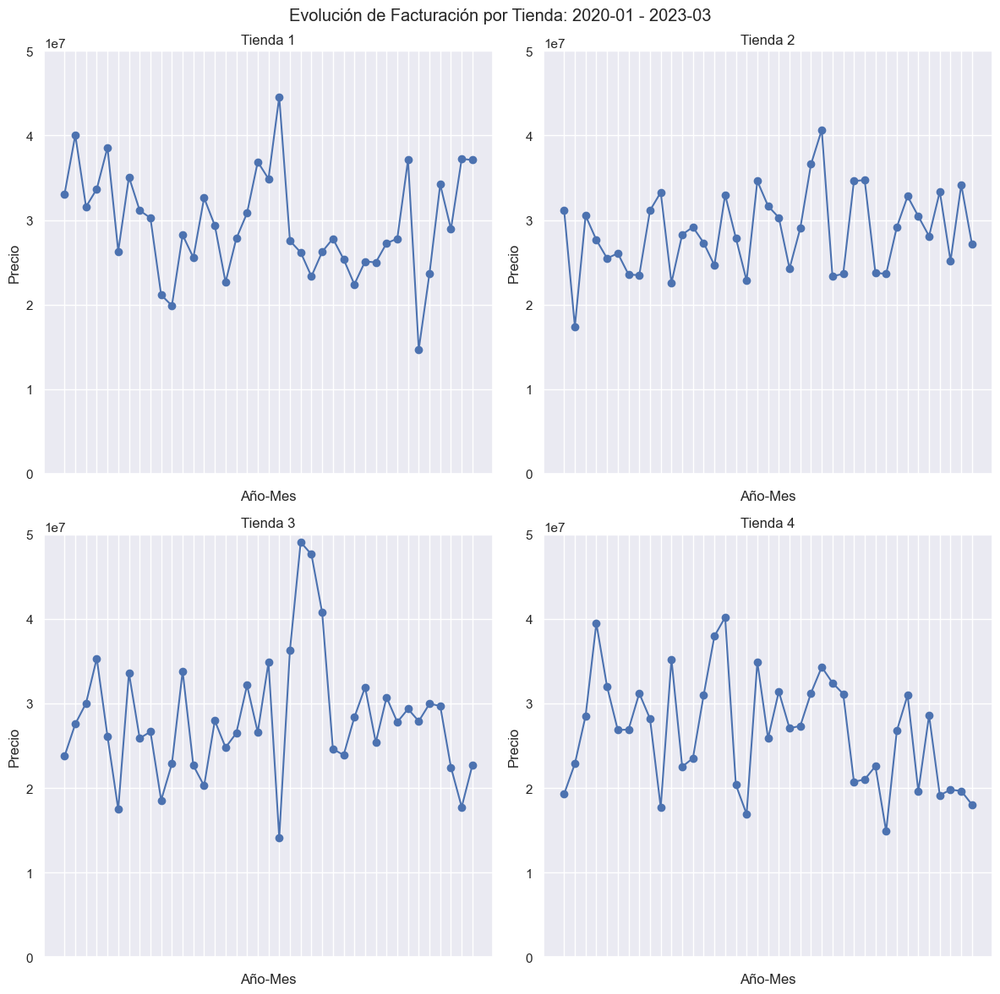

In [38]:
graficos_comparacion(df_list=dfs_meses, 
                     grafico=serie_temporal,
                     columna_1='Año-Mes',
                     columna_2='Precio',
                     super_title= f'Evolución de Facturación por Tienda: {fecha_min} - {fecha_max}',
                     ylim=5e7)

#### Observaciones iniciales - Análisis de Facturación:

A partir de los gráficos presentados, podemos observar lo siguiente:

* Las **tiendas 1 y 2** presentan una evolución de la facturación relativamente estable.
* La **tienda 3** presenta varios picos pronunciados, pero también es la que mantiene el record más alto de facturación.
* La **tienda 4** es la que presenta picos pronunciados, varios meses en los que la facturación no superó los **20.000.000**, entre ellos los últimos 4 meses, por lo que podemos resumir que ultimamente es la que más problemas está teniendo en cuanto a ingresos.

#### Comparaciones - Análisis de Facturación

Realizaré un DataFrame con algunas cifras de cada una de las tiendas para una facil visualización y comparación entre ellas

In [39]:
# Lista de dataframes para iterar sobre cada uno de ellos
dfs_facturacion = [df_facturacion_tienda1, df_facturacion_tienda2, df_facturacion_tienda3, df_facturacion_tienda4]

# Variable que contendrá el nombre de cada tienda
nombres = ['Tienda 1', 'Tienda 2', 'Tienda 3', 'Tienda 4']

# Diccionario utilizado para almacenar los resultados
comparacion_facturacion = {}

# Iterar sobre la enumeracion de la lista creada anteriormente: (idx, df)
for i, df in enumerate(dfs_facturacion):
    # Por cada iteración:
    
    # Calcular la venta total de la tienda
    venta_total = df['Precio'].sum()
    # Obtener la cantidad de dias entre primer y última venta del DataFrame
    dias = (df['Fecha de Compra'].max() - df['Fecha de Compra'].min()).days
    # Calcular el valor de venta promedio por dia de la tienda
    venta_promedio_diaria = venta_total / dias
    # Calcular la venta mensual promedio de la tienda
    venta_mensual_promedio = df.groupby('Año-Mes')['Precio'].sum().mean()
    # Calcular la venta mensual máxima de la tienda
    venta_mensual_maxima = df.groupby(['Año-Mes'])['Precio'].sum().max()
    # Calcular la venta mensual mínima de la tienda
    venta_mensual_minima = df.groupby('Año-Mes')['Precio'].sum().min()
    # Obtener la suma de cuotas ofrecidas de la tienda
    cuotas_ofrecidas = df['Cantidad de cuotas'].sum()
    # Utilizar estructura clave valor para aspecto: valor_corresondiente (serparación con , en miles para mejor visualiación)
    columnas = {'Venta total': f'{venta_total:,.2f}', 
              'Venta Diaria Promedio': f'{round(venta_promedio_diaria, 2):,.2f}',
              'Venta Mensual Promedio': f'{round(venta_mensual_promedio, 2):,.2f}',
              'Venta Mensual Máxima': f'{round(venta_mensual_maxima, 2):,.2f}',
              'Venta Mensual Mínima': f'{round(venta_mensual_minima, 2):,.2f}',
              'Coutas Ofrecidas': cuotas_ofrecidas}
    # Generar una clave en el diccionario inicial con el nombre de la tienda y las coumnas resultantes del proceso anterior
    comparacion_facturacion[nombres[i]] = columnas
    
# Crear un DataFrame con el dicciónario resultante
df_facturacion = pd.DataFrame.from_dict(comparacion_facturacion, orient='index')
df_facturacion

,Venta total,Venta Diaria Promedio,Venta Mensual Promedio,Venta Mensual Máxima,Venta Mensual Mínima,Coutas Ofrecidas
Tienda 1,"1,150,880,400.00","971,207.09","29,509,753.85","44,571,100.00","14,682,000.00",6943
Tienda 2,"1,116,343,500.00","942,062.03","28,624,192.31","40,668,800.00","17,388,800.00",6847
Tienda 3,"1,098,019,600.00","926,598.82","28,154,348.72","49,081,500.00","14,113,600.00",7001
Tienda 4,"1,038,375,700.00","877,006.50","26,625,017.95","40,195,600.00","14,870,800.00",6829


#### Observaciones finales - Análisis de Facturación:

Confirmando lo que se observó en los gráficos presentados anteriormente, podemos concluir lo siguiente en cuanto a la **Facturación** de cada tienda:

* **Tienda 1:** Es la tienda que tiene una *Venta Total*, *Venta Diaria Promedio* y *Venta Mensual Promedio* mayor al resto.
* **Tienda 2:** Ocupa el segundo lugar en *Venta Total*, *Venta Diaria Promedio* y *Venta Mensual Promedio*. A su vez, no esta en el último lugar en *Venta Mensual Máxima* y es la que su *Venta Mensual Mínima* es mayor, por lo cual, resulta ser la tienda más estable.
* **Tienda 3:** Tienda con la mayor *Venta Máxima Mensual* como así la menor *Venta Mínima Mensual*, por lo que presenta mayor inestabilidad que las **Tiendas 1 y 2** pero aún con fuertes ingresos.
* **Tienda 4:** Esta es la tienda que peor ha calificado en relación a la facturación. En todos los campos analizados podemos ver que presenta los valores más bajos. Por lo cual en términos de facturación queda en último lugar.

*Nota: mantuve las cuotas ofrecidas para visualizar si existía una gran diferencia entre estas, ya que una menor cantidad de la misma podría indicar mejor liquidez para la empresa y este podría ser un factor a analizar. Pero a partir de los numeros provistos por el análisis, estos valores no aportan mucho poder analítico.*

**Puntuación Ranking Final - Apartado: Facturación**

In [40]:
for key in ranking_final.keys():
    if key == 'Tienda 1':
        puesto = '1'
    elif key == 'Tienda 2':
        puesto = '2'
    elif key == 'Tienda 3':
        puesto = '3'
    else:
        puesto = '4'
    
    ranking_final[key]['Facturación'] = puesto

### Ventas por Categoría

En esta sección se analizarán las ventas segmentadas por **categoría de producto**, lo cual permite obtener una visión más profunda del comportamiento comercial de cada tienda. Este análisis puede aportar **perspectivas clave sobre los márgenes de ganancia, la eficiencia en el uso del espacio y recursos, así como identificar categorías con alta o baja participación en las ventas.** <br>

Entender qué productos dominan el flujo de ingresos y cuáles tienen una menor incidencia puede resultar fundamental para tomar decisiones estratégicas sobre **stock, promociones o incluso continuidad de ciertas líneas de productos.**

In [41]:
# Checkpoint Análisis Venta por Categoría
df_categorias_tienda1 = df_tienda1.copy()
df_categorias_tienda2 = df_tienda2.copy()
df_categorias_tienda3 = df_tienda3.copy()
df_categorias_tienda4 = df_tienda4.copy()

In [42]:
df_categorias_tienda1.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon,Año-Mes
0,Asistente virtual,Electrónicos,164300.0,6900.0,2021-01-16,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,4.60971,-74.08175,2021-01
1,Mesa de comedor,Muebles,192300.0,8400.0,2022-05-18,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6.25184,-75.56359,2022-05
2,Juego de mesa,Juguetes,209600.0,15900.0,2021-03-15,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10.39972,-75.51444,2021-03
3,Microondas,Electrodomésticos,757500.0,41000.0,2022-05-03,Juan Fernandez,Cali,4,Nequi,1,3.43722,-76.52250,2022-05
4,Silla de oficina,Muebles,335200.0,20200.0,2020-11-07,Maria Alfonso,Medellín,5,Nequi,1,6.25184,-75.56359,2020-11


In [43]:
# Descartar columnas no necesarias para este análisis
df_categorias_tienda1 = df_categorias_tienda1.drop(['Costo de envío', 'Fecha de Compra', 'Vendedor', 
                                                    'Lugar de Compra', 'Calificación', 'Método de pago', 
                                                    'lat', 'lon'], 
                                                   axis=1)
df_categorias_tienda2 = df_categorias_tienda2.drop(['Costo de envío', 'Fecha de Compra', 'Vendedor', 
                                                    'Lugar de Compra', 'Calificación', 'Método de pago', 
                                                    'lat', 'lon'], 
                                                   axis=1)
df_categorias_tienda3 = df_categorias_tienda3.drop(['Costo de envío', 'Fecha de Compra', 'Vendedor', 
                                                    'Lugar de Compra', 'Calificación', 'Método de pago', 
                                                    'lat', 'lon'], 
                                                   axis=1)
df_categorias_tienda4 = df_categorias_tienda4.drop(['Costo de envío', 'Fecha de Compra', 'Vendedor', 
                                                    'Lugar de Compra', 'Calificación', 'Método de pago', 
                                                    'lat', 'lon'], 
                                                   axis=1)


In [44]:
df_categorias_tienda1.head()

,Producto,Categoría del Producto,Precio,Cantidad de cuotas,Año-Mes
0,Asistente virtual,Electrónicos,164300.0,8,2021-01
1,Mesa de comedor,Muebles,192300.0,4,2022-05
2,Juego de mesa,Juguetes,209600.0,1,2021-03
3,Microondas,Electrodomésticos,757500.0,1,2022-05
4,Silla de oficina,Muebles,335200.0,1,2020-11


#### Comparaciones - Ventas por Categoría

In [45]:
# Lista con los DataFrames utilizados para generar los gráficos de comparación
dfs_categorias = [df_categorias_tienda1, df_categorias_tienda2, df_categorias_tienda3, df_categorias_tienda4]

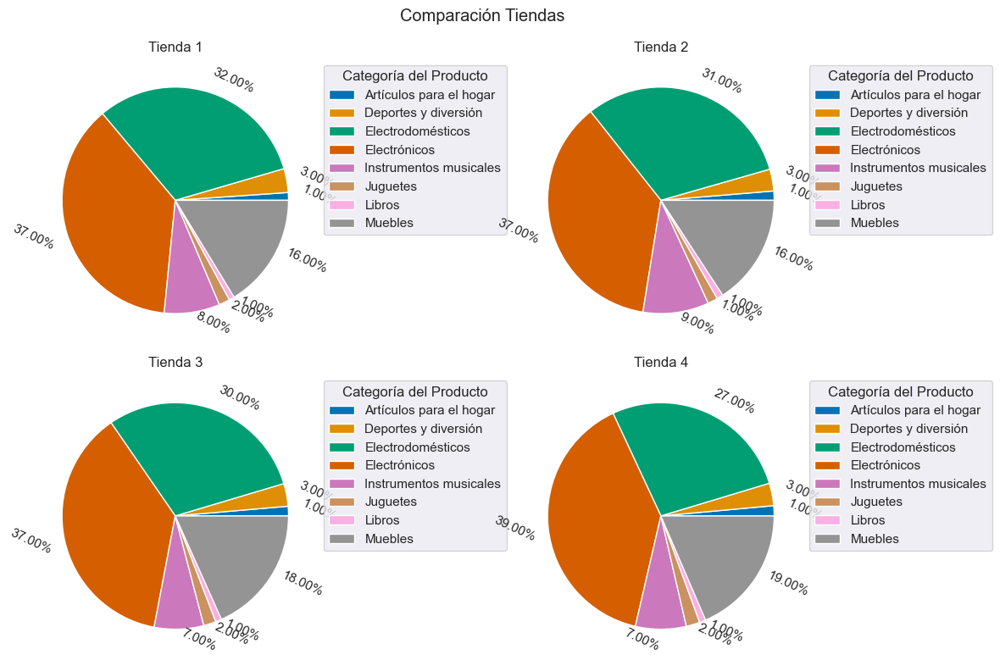

In [46]:
graficos_comparacion(df_list=dfs_categorias,
                     grafico=crear_piechart,
                     figsize=(12,8),
                     columna_1='Categoría del Producto',
                     columna_2='Precio',
                     xlabel_rotation=-25)
                     

#### Observaciones iniciales - Ventas por Categoría

A partir de los gráficos podemos observar que la distribución de las ventas por categoría es bastante uniforme a lo largo de todas las tiendas. En loq ue respecta a la decisión de cuál tienda debe ser vendida, este aspécto parece no aportar valor significativo al análisis.<br>
Sin embargo, se explorará más en detalle las cifras de cada una de ellas para entender mejor el impacto que cada una tiene para la compañía.

**Comparaciones**

In [47]:
# DataFrame con sumatoria total de ventas por categoría en cada tienda

comparacion_categorias = {}

# Iterar sobre la lista de DataFrames
for i, df in enumerate(dfs_categorias):
    # Sumar el valor de las ventas de cada categoría
    ventas_categoria = df.groupby('Categoría del Producto')['Precio'].sum()

    comparacion_categorias[nombres[i]] = ventas_categoria

# Crear el DataFrame
comparacion_categorias = pd.DataFrame.from_dict(comparacion_categorias, orient='index')

comparacion_categorias

,Artículos para el hogar,Deportes y diversión,Electrodomésticos,Electrónicos,Instrumentos musicales,Juguetes,Libros,Muebles
Tienda 1,12698400.0,39290000.0,363685200.0,429493500.0,91299000.0,17995700.0,8784900.0,187633700.0
Tienda 2,14746900.0,34744500.0,348567800.0,410831100.0,104990300.0,15945400.0,10091200.0,176426300.0
Tienda 3,15060000.0,35593100.0,329237900.0,410775800.0,77380900.0,19401100.0,9498700.0,201072100.0
Tienda 4,15074500.0,33350100.0,283260200.0,409476100.0,75102400.0,20262200.0,9321300.0,192528900.0


In [48]:
# DataFrame con porcentajes de ventas por categoría en cada tienda

porcentajes_categorias = []

for df in dfs_categorias:
    sum_total = df['Precio'].sum()
    
    porcentajes = df.groupby('Categoría del Producto')['Precio'].sum() / sum_total * 100
    porcentajes.index.name = None
    porcentajes_categorias.append(porcentajes)

df_porcentajes_categorias = pd.DataFrame(porcentajes_categorias)
df_porcentajes_categorias = df_porcentajes_categorias.round(2).astype(str)+'%'
df_porcentajes_categorias.index = nombres
df_porcentajes_categorias

,Artículos para el hogar,Deportes y diversión,Electrodomésticos,Electrónicos,Instrumentos musicales,Juguetes,Libros,Muebles
Tienda 1,1.1%,3.41%,31.6%,37.32%,7.93%,1.56%,0.76%,16.3%
Tienda 2,1.32%,3.11%,31.22%,36.8%,9.4%,1.43%,0.9%,15.8%
Tienda 3,1.37%,3.24%,29.98%,37.41%,7.05%,1.77%,0.87%,18.31%
Tienda 4,1.45%,3.21%,27.28%,39.43%,7.23%,1.95%,0.9%,18.54%


#### Observaciones Finales - Ventas por Categoría

Tanto los gráficos como las tablas muestran que las diferencias en la proporción de ventas por categoría entre tiendas no son lo suficientemente significativas como para influir en la decisión sobre cuál tienda vender.
Se observa un cierto balance entre categorías: por ejemplo, la **Tienda 4** lidera en ventas de ***Electrónicos*** (la categoría más fuerte), pero presenta el menor porcentaje en ***Electrodomésticos*** (la segunda en importancia). Esto sugiere una compensación natural entre categorías predominantes, lo cual refuerza la conclusión de que este análisis, por sí solo, **no aporta un diferencial decisivo** para la toma de decisiones.


#### Observaciones Adicionales

Un punto interesante surge al observar que las categorías ***Artículos para el hogar, Deportes y Diversión, Juguetes y Libros***, representan en conjunto **aproximadamente solo el 7% de las ventas totales** de cada tienda:

**Tienda 1:** 6.83%<br>
**Tienda 2:** 6.76%<br>
**Tienda 3:** 7.25%<br>
**Tienda 4:** 7.51%<br>

Este patrón podría justificar un análisis complementario enfocado en **márgenes, costos de almacenamiento o logística** para estas categorías. Sería valioso determinar si su comercialización sigue siendo rentable, o si sería más estratégico reasignar recursos hacia categorías más relevantes.

### Clasificación Promedio de la tienda

Hoy en día, la **satisfacción del cliente** —es decir, la *experiencia del usuario*— tiene un impacto directo y considerable en el éxito o fracaso de cualquier empresa. <br>
Las calificaciones que los clientes dejan luego de realizar una compra no solo reflejan su nivel de satisfacción, sino que también **influyen en la fidelización** y en la **capacidad de atraer nuevos compradores**.<br>
Por ello, evaluar este aspecto del negocio resulta fundamental para comprender y proyectar la salud económica de la compañía.

In [49]:
# Checkpoint para Análisis de Calificación Promedio de cada tienda
df_calificaciones_tienda1 = df_tienda1.copy()
df_calificaciones_tienda2 = df_tienda2.copy()
df_calificaciones_tienda3 = df_tienda3.copy()
df_calificaciones_tienda4 = df_tienda4.copy()

In [50]:
# Conservar solo la columna de 'Calificación' ya que es la única necesaria para este análisis
df_calificaciones_tienda1 = df_calificaciones_tienda1.loc[:, ['Calificación']]
df_calificaciones_tienda2 = df_calificaciones_tienda2.loc[:, ['Calificación']]
df_calificaciones_tienda3 = df_calificaciones_tienda3.loc[:, ['Calificación']]
df_calificaciones_tienda4 = df_calificaciones_tienda4.loc[:, ['Calificación']]

In [51]:
df_calificaciones_tienda1.head()

,Calificación
0,4
1,1
2,1
3,4
4,5


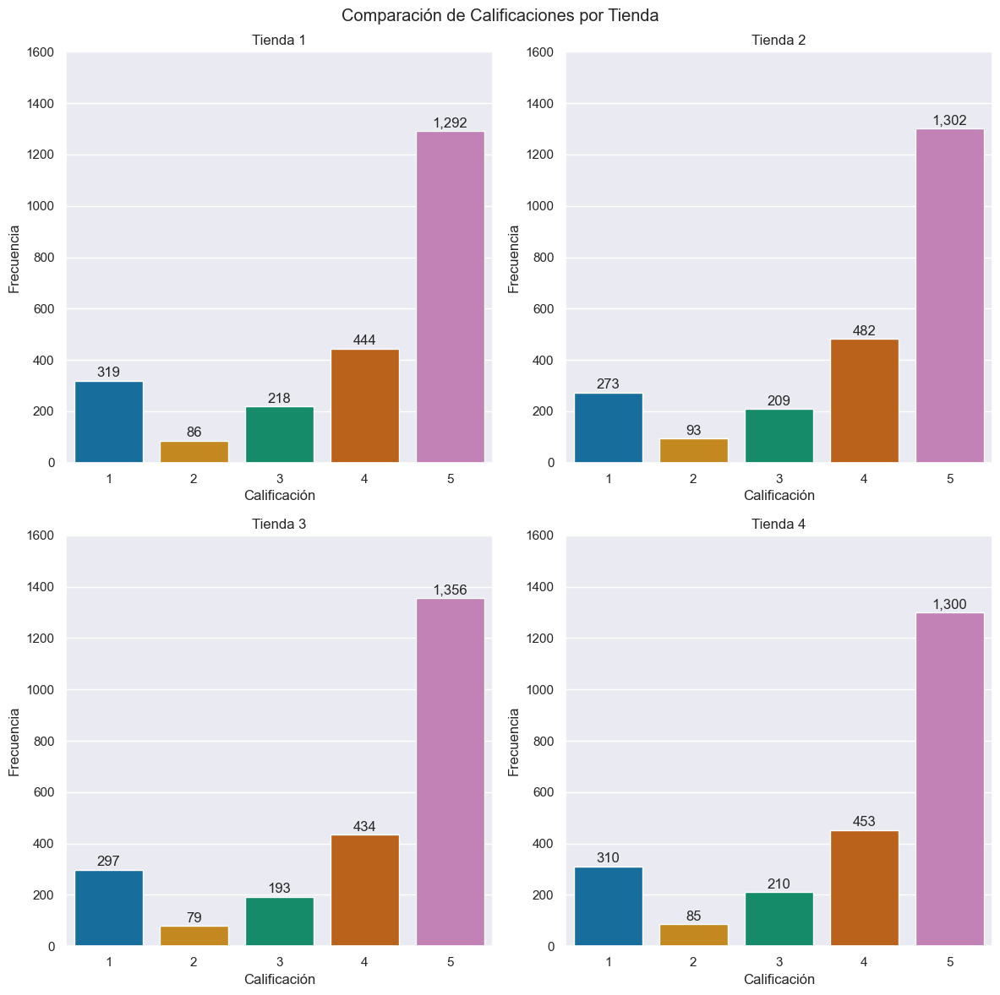

In [52]:
# Listado de DataFrames con calificaciones para iterar sobre ellos
dfs_calificaciones = [df_calificaciones_tienda1, df_calificaciones_tienda2, df_calificaciones_tienda3, df_calificaciones_tienda4]

# Generar el gráfico de comparación para rápida visualización
graficos_comparacion(df_list=dfs_calificaciones, 
                     grafico=crear_barplot, 
                     columna_1='Calificación',
                     super_title='Comparación de Calificaciones por Tienda',
                     ylim=1600,
                     mostrar_valores=True)

#### Observaciones Iniciales - Clasificación Promedio de la tienda

A simple vista las calificaciones estan distribuidas de forma relativamente uniforma entre las tiendas:

**Calificacion 5:** Entre 1292 y 1356<br>
**Calificacion 4:** Entre 434 y 482<br>
**Calificacion 3:** Entre 193 y 218<br>
**Calificacion 2:** Entre 79 y 93<br>
**Calificacion 1:** Entre 273 y 319<br>

Dado que no se observan diferencias marcadas en la distribución de calificaciones, se procederá a evaluar la **calificación promedio** de cada tienda como **indicador** más preciso de **satisfacción del cliente**.

In [53]:
comparacion_calificaciones = {}

for i, df in enumerate(dfs_calificaciones):
    frecuencias = df.value_counts()
    calificacion_promedio = round(df['Calificación'].mean(), 2)

    comparacion_calificaciones[nombres[i]] = frecuencias
    comparacion_calificaciones[nombres[i]]['Calificación Promedio'] = f'{calificacion_promedio} pts'

df_calificaciones = pd.DataFrame.from_dict(comparacion_calificaciones, orient='index')
columnas_orden = [5, 4, 3, 2, 1,'Calificación Promedio']
df_calificaciones = df_calificaciones[columnas_orden]
df_calificaciones

,5,4,3,2,1,Calificación Promedio
Tienda 1,1292,444,218,86,319,3.98 pts
Tienda 2,1302,482,209,93,273,4.04 pts
Tienda 3,1356,434,193,79,297,4.05 pts
Tienda 4,1300,453,210,85,310,4.0 pts


#### Observaciones finales - Clasificación Promedio de la tienda

En cuanto a las **calificaciones**, se observa que la **Tienda 1 es la única con una puntuación promedio inferior a los 4 puntos**.
Si tomamos en cuenta que esta misma tienda presenta el **mayor volumen de ingresos**, podríamos inferir que tiene una mayor afluencia de clientes, lo cual podría estar afectando negativamente la calidad del servicio, especialmente en momentos de alta demanda. Es posible que el personal no logre mantener un nivel de atención uniforme para todos los clientes.

Este hallazgo sugiere la necesidad de **profundizar en las causas** de esta calificación más baja. Identificar los motivos y aplicar estrategias correctivas sería clave, ya que la satisfacción del cliente puede ser un factor determinante en la sostenibilidad y proyección a futuro de esta tienda.

**Puntuación Ranking Final - Apartado: Calificación Clientes**

In [54]:
for tienda in nombres:
    if tienda == 'Tienda 1':
        ranking_final[tienda]['Calificación Clientes'] = 4
    elif tienda == 'Tienda 2':
        ranking_final[tienda]['Calificación Clientes'] = 2
    elif tienda == 'Tienda 3':
        ranking_final[tienda]['Calificación Clientes'] = 1
    else:
        ranking_final[tienda]['Calificación Clientes'] = 3

In [55]:
ranking_final

{'Tienda 1': {'Facturación': '1', 'Calificación Clientes': 4},
 'Tienda 2': {'Facturación': '2', 'Calificación Clientes': 2},
 'Tienda 3': {'Facturación': '3', 'Calificación Clientes': 1},
 'Tienda 4': {'Facturación': '4', 'Calificación Clientes': 3}}

### Productos más y menos vendidos

Con la intención de complementar el análisis de ventas segmentadas por **categorías**, se analizará qué **productos son los más y menos vendidos**, así como la proporción de ingresos que representan dentro de su correspondiente categoría.

In [56]:
# Checkpoint para Análisis de Productos Más y Menos Vendidos
df_productos_tienda1 = df_tienda1.copy()
df_productos_tienda2 = df_tienda2.copy()
df_productos_tienda3 = df_tienda3.copy()
df_productos_tienda4 = df_tienda4.copy()

In [57]:
df_productos_tienda1.head(0)

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon,Año-Mes


In [58]:
# Descartar las columnas que no serán necesarias para este análisis
df_productos_tienda1 = df_productos_tienda1.drop(['Costo de envío', 'Fecha de Compra', 'Vendedor', 
                                                  'Lugar de Compra', 'Calificación', 'lat', 'lon'], 
                                                 axis=1)
df_productos_tienda2 = df_productos_tienda2.drop(['Costo de envío', 'Fecha de Compra', 'Vendedor', 
                                                  'Lugar de Compra', 'Calificación', 'lat', 'lon'], 
                                                 axis=1)
df_productos_tienda3 = df_productos_tienda3.drop(['Costo de envío', 'Fecha de Compra', 'Vendedor', 
                                                  'Lugar de Compra', 'Calificación', 'lat', 'lon'], 
                                                 axis=1)
df_productos_tienda4 = df_productos_tienda4.drop(['Costo de envío', 'Fecha de Compra', 'Vendedor', 
                                                  'Lugar de Compra', 'Calificación', 'lat', 'lon'], 
                                                 axis=1)

In [59]:
# Controlar la cantidad de productos únicos en cada tienda
cantidad_productos_tienda1 = len(df_productos_tienda1['Producto'].unique())
cantidad_productos_tienda2 = len(df_productos_tienda2['Producto'].unique())
cantidad_productos_tienda3 = len(df_productos_tienda3['Producto'].unique())
cantidad_productos_tienda4 = len(df_productos_tienda4['Producto'].unique())

print(f'Cantidad de productos únicos vendidos en Tienda 1: {cantidad_productos_tienda1}')
print(f'Cantidad de productos únicos vendidos en Tienda 2: {cantidad_productos_tienda2}')
print(f'Cantidad de productos únicos vendidos en Tienda 3: {cantidad_productos_tienda3}')
print(f'Cantidad de productos únicos vendidos en Tienda 4: {cantidad_productos_tienda4}')

Cantidad de productos únicos vendidos en Tienda 1: 51
Cantidad de productos únicos vendidos en Tienda 2: 51
Cantidad de productos únicos vendidos en Tienda 3: 51
Cantidad de productos únicos vendidos en Tienda 4: 51


*Nota: Como tenemos un total de 51 productos únicos, tomaré el 10% más vendidos y menos vendidos para el análisis, es decir RANK 5 de cada grupo*.

In [60]:

dfs_productos = [df_productos_tienda1, df_productos_tienda2, df_productos_tienda3, df_productos_tienda4]

productos = {}


for i, df in enumerate(dfs_productos):
    cantidad_productos = df.groupby('Producto')['Producto'].value_counts()
    for item in cantidad_productos.items():
        if item[0] not in productos:
            productos[item[0]] = {}
            productos[item[0]][nombres[i]] = item[1]
        else:
            productos[item[0]][nombres[i]] = item[1]

In [61]:
df_productos_frecuencias = pd.DataFrame.from_dict(productos, orient='index')
df_productos_frecuencias.head()

,Tienda 1,Tienda 2,Tienda 3,Tienda 4
Ajedrez de madera,49,45,47,39
Armario,60,54,49,34
Asistente virtual,40,38,39,50
Auriculares,50,37,43,44
Auriculares con micrófono,33,44,39,42


In [62]:
# Agregar columna con el total vendido de cada producto
df_productos_frecuencias['Total Vendidos'] = df_productos_frecuencias.apply(lambda row: int(row.sum()), axis=1)

*Nota: debido a que estamos analizando qué productos son más y menos vendidos, resulta pertinente incorporar también el análisis de ventas segmentadas por categoría, ya que podría aportar una perspectiva valiosa, por ejemplo, si un producto se vende poco pero corresponde a una segmentación que proporciona un ingreso considerable, o si existen productos que se venden en gran cantidad pero que generan pocos ingresos para la empresa.*

In [63]:
# Crear diccionario {'producto': 'categoría'} a partir de alguno de los dataframes de productos
producto_categoria = df_productos_tienda1.drop_duplicates(subset='Producto').set_index('Producto')['Categoría del Producto'].to_dict()

# Crear la columna 'Categoría del Producto' en df_productos_frecuencias
df_productos_frecuencias['Categoría del Producto'] = df_productos_frecuencias.index.map(producto_categoria)
df_productos_frecuencias.head()

,Tienda 1,Tienda 2,Tienda 3,Tienda 4,Total Vendidos,Categoría del Producto
Ajedrez de madera,49,45,47,39,180,Juguetes
Armario,60,54,49,34,197,Muebles
Asistente virtual,40,38,39,50,167,Electrónicos
Auriculares,50,37,43,44,174,Electrónicos
Auriculares con micrófono,33,44,39,42,158,Electrónicos


In [64]:
# Mostrar el DataFrame con el porcentaje de ventas por categoría para utilizar en el análisis
df_porcentajes_categorias

,Artículos para el hogar,Deportes y diversión,Electrodomésticos,Electrónicos,Instrumentos musicales,Juguetes,Libros,Muebles
Tienda 1,1.1%,3.41%,31.6%,37.32%,7.93%,1.56%,0.76%,16.3%
Tienda 2,1.32%,3.11%,31.22%,36.8%,9.4%,1.43%,0.9%,15.8%
Tienda 3,1.37%,3.24%,29.98%,37.41%,7.05%,1.77%,0.87%,18.31%
Tienda 4,1.45%,3.21%,27.28%,39.43%,7.23%,1.95%,0.9%,18.54%


*Nota: Crearé un **Pie Chart** con la proporción total por categoría en la compañía.*

<Axes: title={'center': 'Proporción Venta Total por Categoría'}>

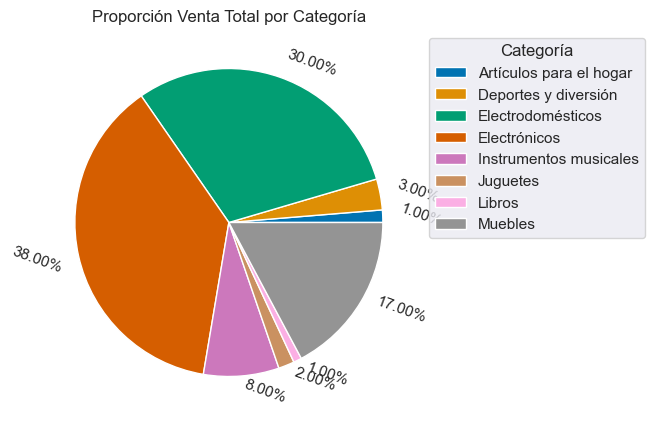

In [65]:
# Crear el total de las categorías entre las cuatro tiendas
total_categorias = {}

# Iterar sobre la lista de DataFrames creada en el análisis de categorías
for df in dfs_categorias:
    # Obtener el total de la categoría"
    total = df.groupby('Categoría del Producto')['Precio'].sum()
    # Iterar sobre la serie obtenida
    for item in total.items():
        # Si la categoría no existe en el diccionario, la creamos y le asignamos el valor de la iteración actual
        if item[0] not in total_categorias:
            total_categorias[item[0]] = item[1]
        # Si la categoría existe en el diccionario, sumamos el valor correspondiente a la misma de la iteración actual al total ya almacenado
        else:
            total_categorias[item[0]] += item[1]
    
# Crear DataFrame con los totales
df_total_categorias = pd.DataFrame.from_dict(total_categorias, orient='index')
df_total_categorias = df_total_categorias.reset_index()
columnas = ['Categoría', 'Total']
df_total_categorias.columns = columnas

# Crear el grafico de torta con la proporcion de cada categoría en toda la empresa
crear_piechart(df=df_total_categorias,
               columna1 = 'Categoría',
               columna2 = 'Total',
               plot_size = (7, 5),
               titulo = 'Proporción Venta Total por Categoría',
               xlabel_rotation = -20)

#### 5 productos menos vendidos

In [66]:
# Visualizar los 5 productos menos vendidos
df_productos_frecuencias.sort_values('Total Vendidos').head(5)

,Tienda 1,Tienda 2,Tienda 3,Tienda 4,Total Vendidos,Categoría del Producto
Celular ABXY,33,41,44,39,157,Electrónicos
Auriculares con micrófono,33,44,39,42,158,Electrónicos
Mochila,39,45,36,43,163,Deportes y diversión
Guitarra eléctrica,47,47,38,33,165,Instrumentos musicales
Ciencia de datos con Python,39,43,46,38,166,Libros


#### Observaciones - Productos Menos Vendidos


Al evaluar que los 5 productos menos vendidos, vemos que:

* Los 2 que presentan menor volumen de ventas: ***Celular ABXY*** y ***Auriculares con micrófono*** pertenecen a la categoría que más ingresos trae a la empresa. Esto significa que a pesar de un volumen menor en relación a otros productos, debido a su precio, la venta de estos productos se traduce en un mayor ingreso para la empresa *(cabe aclarar que para hablar de ganancias habría que considerar el margen que tienen dichos productos)*.

* De los 3 productos restantes, dos de ellos: ***Mochila*** y ***Ciencia de datos con Python*** **(puestos 3 y 5, respectivamente)** pertenecen a dos de las cuatro categorías que, como se observa en el gráfico generado en esta sección, aportan en su totalidad aproximadamente un **7%** del total de ingresos de la empresa, que son: **Juguetes, Libros, Artículos para el Hogar y Deportes y Diversión**, lo que contribuye a la conclusión obtenida en el *análisis de ventas por categoría*, donde se menciona que podría ser interesante evaluar **márgenes, y costos de almacenamiento y logística** en relación a estas categorías, para definir si es rentable continuar con su comercialización o no.

* El producto ***Guitarra Eléctrica***, ocupa el **puesto 4** en los productos menos vendidos. Este, pertenece a la categoría **Instrumentos musicales**, la cual corresponde a un **8%** del total de ingresos de la empresa *(1% más que las 4 categorías señaladas anteriormente)*. Esto puede deberse a que este producto en particular tiene un **publico objetivo** más específico o a un **precio elevado**, lo que dificulta su rotación pero que aún así pueda mantener su rentabilidad.

#### 5 productos más vendidos

In [67]:
# Visualizar los 5 productos más vendidos
df_productos_frecuencias.sort_values('Total Vendidos', ascending=False).head(5)

,Tienda 1,Tienda 2,Tienda 3,Tienda 4,Total Vendidos,Categoría del Producto
Mesa de noche,56,44,55,55,210,Muebles
Carrito de control remoto,52,47,52,55,206,Juguetes
Microondas,60,62,36,48,206,Electrodomésticos
Batería,53,61,41,48,203,Instrumentos musicales
Cama king,44,45,56,56,201,Muebles


#### Observaciones - Productos Más Vendidos

Entre los productos más vendidos:

* El **primer y último puesto** corresponden a **Mesa de noche** y **Cama king**, respectivamente. Ambos pertenecientes a la categoría **Muebles**. Esta, ocupa el ranking 3 entre las categorías que más ingresos generan para la empresa. Por lo cual podemos pensar en que el nivel de ingresos de esta categoría podría deberse a un **gran volumen de ventas** lo cual podría deberse a factores como una buena percepción de calidad-precio, que valdría la pena investigar.

* El **tercer puesto** corresponde al producto **Microondas**, perteneciente a la categoría **Electrodomésticos**, la cual ocupa el ranking 2 en relación a los ingresos segmentados por categoría.

De estos dos items, resulta interesante observar que gran volumen de las ventas de la empresa y sus ingresos, provienen de mobiliario doméstico: **Muebles** y **Electrodomésticos**. Esto puede ser un indicador para desarrollar campañas publicitarias o promociones en relación a estas categorías para la captación de clientes e incremento de las ventas.

* El **cuarto puesto** corresponde a **Batería**, la cual pertenece a **Instrumentos Musicales**. Si realizamos una conexión entre la conclusión obtenida en las **Observaciones de Productos Menos Vendidos** con respecto al producto **Guitarra Eléctrica**, lo cual evidencia una variabilidad significativa dentro de la categoría que merece un análisis más detallado para entender mejor el comportamiento de cada producto.

* Por último tenemos en el **segundo puesto** el producto **Carrito de control remoto**, perteneciente a la categoría **Juguetes**. Este no es más que otro indicador de que resulta pertinente evaluar las cuatro categorías que menos ingresos generan para la empresa, ya que como se puede observar, se tiene un gran volumen de venta de este producto pero los ingresos generados por este son relativamente bajos, posiblemente debido a su bajo precio unitario o margen.

#### Observaciones Adicionales

Destaco para usted señor Juan que, si es que usted está de acuerdo, debemos abordar en un próximo análisis en relación a las categorías **Juguetes, Libros, Artículos para el hogar y Deportes y Diversión**, para evaluar margenes y costos de almacenamiento y logística, con la intención de mejorar el rendimiento económico de la empresa tanto en cuestiones de recursos como de ganancias.

*Nota: también sería interesante entender el margen, en cuestiones de porcentaje, de cada producto para una evaluación aún más precisa de la rentabilidad aportada por cada producto.*




### Costo promedio de envío por tienda

Por último, se realizará un análisis de los costos de envío por cada tienda.<br>
Esto resulta de gran relevancia ya que tiene un impacto directo en los márgenes totales tanto de cada tienda como de la empresa en general.

In [68]:
# Checkpoints para Análisis de Facturación
df_costoenvio_tienda1 = df_tienda1.copy()
df_costoenvio_tienda2 = df_tienda2.copy()
df_costoenvio_tienda3 = df_tienda3.copy()
df_costoenvio_tienda4 = df_tienda4.copy()

In [69]:
df_costoenvio_tienda1.head(0)

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon,Año-Mes


In [70]:
# Eliminar columnas que no serán necesarias para este análisis
df_costoenvio_tienda1 = df_costoenvio_tienda1.drop(['Producto', 'Categoría del Producto', 'Precio', 
                                                    'Vendedor', 'Calificación', 'Método de pago', 'Cantidad de cuotas'], 
                                                   axis=1)
df_costoenvio_tienda2 = df_costoenvio_tienda2.drop(['Producto', 'Categoría del Producto', 'Precio', 
                                                    'Vendedor', 'Calificación', 'Método de pago', 'Cantidad de cuotas'],
                                                   axis=1)
df_costoenvio_tienda3 = df_costoenvio_tienda3.drop(['Producto', 'Categoría del Producto', 'Precio', 
                                                    'Vendedor', 'Calificación', 'Método de pago', 'Cantidad de cuotas'], 
                                                   axis=1)
df_costoenvio_tienda4 = df_costoenvio_tienda4.drop(['Producto', 'Categoría del Producto', 'Precio', 
                                                    'Vendedor', 'Calificación', 'Método de pago', 'Cantidad de cuotas'], 
                                                   axis=1)

In [71]:
df_costoenvio_tienda1.head()

,Costo de envío,Fecha de Compra,Lugar de Compra,lat,lon,Año-Mes
0,6900.0,2021-01-16,Bogotá,4.60971,-74.08175,2021-01
1,8400.0,2022-05-18,Medellín,6.25184,-75.56359,2022-05
2,15900.0,2021-03-15,Cartagena,10.39972,-75.51444,2021-03
3,41000.0,2022-05-03,Cali,3.43722,-76.52250,2022-05
4,20200.0,2020-11-07,Medellín,6.25184,-75.56359,2020-11


In [72]:
# Crar lista con DataFrames para Análisis de Costo de Envío
dfs_costoenvio = [df_costoenvio_tienda1, df_costoenvio_tienda2, df_costoenvio_tienda3, df_costoenvio_tienda4]

*Nota: como primer paso crearé un dataframe que unifique la latitud y longitud de todos los clientes y agregue una etiqueta de a qué tienda corresponde cada cliente. Luego pasaré estos datos en un **scatter plot** (gráfico de putos) para ver la distribución de los clientes en el mapa*

In [73]:
# Asignar una etiqueta de la tienda correspondiente a cada registro para luego diferenciar en el gráfico
for i, df in enumerate(dfs_costoenvio):
    df['Tienda'] = nombres[i]

ubicacion_clientes = pd.concat([
                                df_costoenvio_tienda1[['lat', 'lon', 'Tienda']],
                                df_costoenvio_tienda2[['lat', 'lon', 'Tienda']],
                                df_costoenvio_tienda3[['lat', 'lon', 'Tienda']],
                                df_costoenvio_tienda4[['lat', 'lon', 'Tienda']],
                                ], ignore_index=True)
ubicacion_clientes

,lat,lon,Tienda
0,4.60971,-74.08175,Tienda 1
1,6.25184,-75.56359,Tienda 1
2,10.39972,-75.51444,Tienda 1
3,3.43722,-76.52250,Tienda 1
4,6.25184,-75.56359,Tienda 1
...,...,...,...
9430,6.25184,-75.56359,Tienda 4
9431,7.12539,-73.11980,Tienda 4
9432,4.60971,-74.08175,Tienda 4
9433,3.43722,-76.52250,Tienda 4


In [74]:
# Controlar el tipo de dato y valores nulos
ubicacion_clientes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9435 entries, 0 to 9434
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   lat     9435 non-null   float64
 1   lon     9435 non-null   float64
 2   Tienda  9435 non-null   object 
dtypes: float64(2), object(1)
memory usage: 221.3+ KB


In [75]:
# Obtener los valores máximos y mínimos de latitud y longitud para establecer el límite del gráfico
min_lat, max_lat = min(ubicacion_clientes['lat']), max(ubicacion_clientes['lat'])
min_lon, max_lon = min(ubicacion_clientes['lon']), max(ubicacion_clientes['lon'])

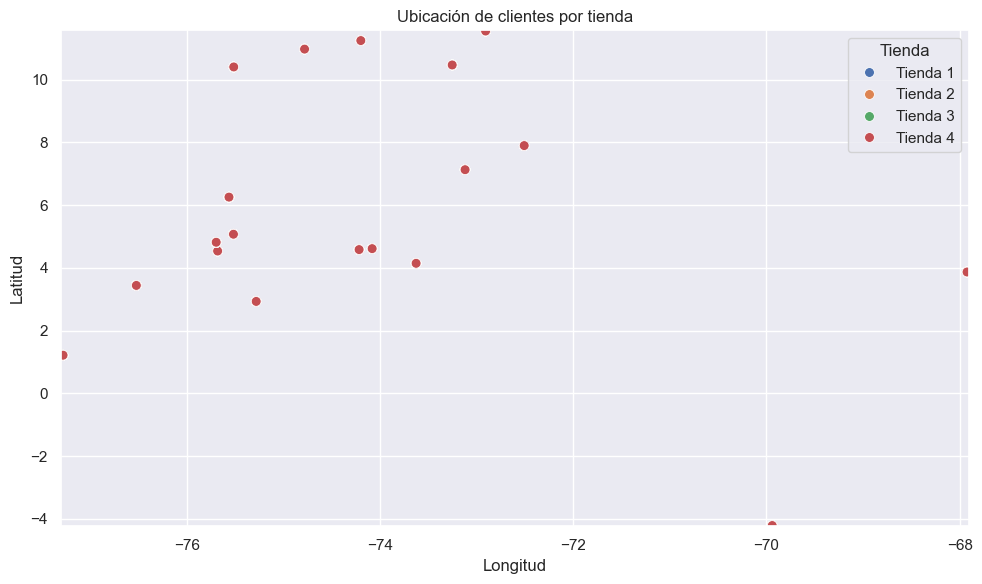

In [76]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=ubicacion_clientes, x='lon', y='lat', hue='Tienda', s=50)
plt.title('Ubicación de clientes por tienda')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.xlim(min_lon-0.02, max_lon+0.02)
plt.ylim(min_lat-0.02, max_lat+0.02)
plt.grid(True)
plt.tight_layout()
plt.show()

In [77]:
ubicacion_clientes[['lat','lon']].value_counts()

lat        lon      
 4.60971   -74.08175    3943
 6.25184   -75.56359    2314
 3.43722   -76.52250    1007
 4.81333   -75.69611     517
 10.96854  -74.78132     310
 10.39972  -75.51444     242
 7.89391   -72.50782     186
 7.12539   -73.11980     181
 11.54444  -72.90722     163
 11.24079  -74.19904     151
-4.21528   -69.94056     142
 1.21361   -77.28111      94
 5.06889   -75.51738      41
 2.92730   -75.28189      40
 4.14200   -73.62664      29
 4.53389   -75.68111      28
 4.57937   -74.21682      19
 3.86530   -67.92390      14
 10.46314  -73.25322      14
Name: count, dtype: int64

In [78]:
len(ubicacion_clientes[['lat','lon']].value_counts())

19

In [79]:
df_costoenvio_tienda1['Lugar de Compra'].unique()

array(['Bogotá', 'Medellín', 'Cartagena', 'Cali', 'Santa Marta',
       'Pereira', 'Barranquilla', 'Villavicencio', 'Inírida', 'Cúcuta',
       'Manizales', 'Neiva', 'Bucaramanga', 'Valledupar', 'Pasto',
       'Riohacha', 'Armenia', 'Leticia', 'Soacha'], dtype=object)

In [80]:
len(df_costoenvio_tienda1['Lugar de Compra'].unique())

19

In [81]:
ubicacion_clientes.groupby(['lat', 'lon'])['Tienda'].nunique().value_counts()

Tienda
4    19
Name: count, dtype: int64

#### Observaciones iniciales - Costo Promedio de envío por tienda

Es posible observar que los datos en las columnas **lat** y **lon** contienen 19 combinaciones de valores distintos, la misma cantidad de ciudades registradas en la columna **Lugar de Compra**. Esto quiere decir que no se posee información precisa de la ubicación de cada cliente, sino la ciudad desde la cual se realizó la compra.

A su vez, al intentar graficar diferenciando los puntos con un color por tienda, vemos que todos figuran del mismo color, correspondiente al color asignado al último DataFrame. Esto nos indica que todas las tiendas venden a todas las ciudades registradas en nuestro dataset.

Este es un primer indicio de que podría realizarse un análisis en cuanto a la ubicación de cada tienda y las ciudades a las cuales se envían productos desde cada una de ellas, para así reducir distancias y costos de envío.

**Series temporales Costo de Envío**

In [82]:
# Agrupación por Mes y Año para graficar la evolución del Costo de Envío
df_costenv_mes_tienda1 = df_costoenvio_tienda1.groupby(['Año-Mes']).sum(['Costo de envío']).reset_index()
df_costenv_mes_tienda2 = df_costoenvio_tienda2.groupby(['Año-Mes']).sum(['Costo de envío']).reset_index()
df_costenv_mes_tienda3 = df_costoenvio_tienda3.groupby(['Año-Mes']).sum(['Costo de envío']).reset_index()
df_costenv_mes_tienda4 = df_costoenvio_tienda4.groupby(['Año-Mes']).sum(['Costo de envío']).reset_index()

In [83]:
df_costenv_mes_tienda1.head()

,Año-Mes,Costo de envío,lat,lon
0,2020-01,1753100.0,357.31081,-5319.64065
1,2020-02,2154500.0,359.88174,-4636.62652
2,2020-03,1671100.0,386.96442,-5319.38787
3,2020-04,1806900.0,300.48965,-3893.21394
4,2020-05,2048200.0,341.64557,-4630.59446


In [84]:
# Lista para realizar los gráficos de comparación de la evolución de 'Costo de envío'
dfs_costoenvio_mes = [df_costenv_mes_tienda1, df_costenv_mes_tienda2, df_costenv_mes_tienda3, df_costenv_mes_tienda4]

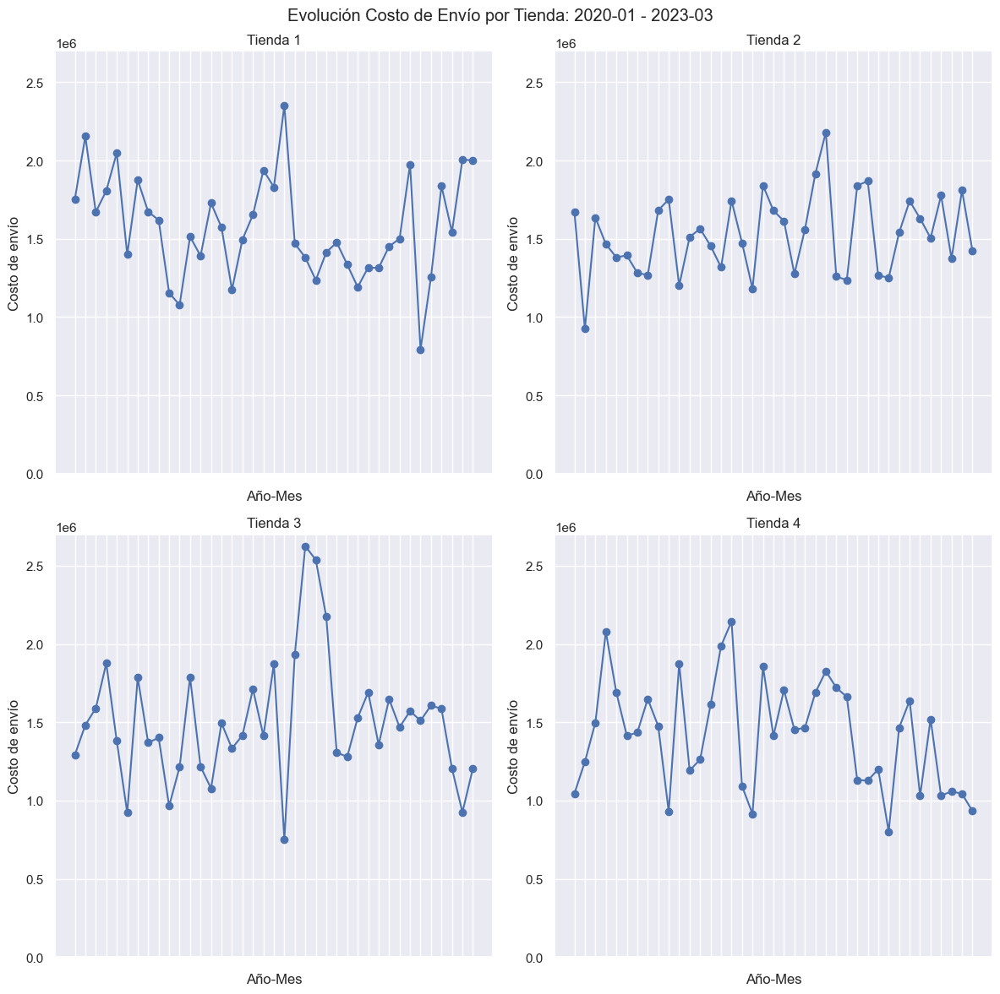

In [85]:
# Generar gráfico de comparación de series temporales
graficos_comparacion(df_list=dfs_costoenvio_mes,
                     grafico=serie_temporal,
                     columna_1='Año-Mes',
                     columna_2='Costo de envío',
                     super_title=f'Evolución Costo de Envío por Tienda: {fecha_min} - {fecha_max}',
                     ylim=2.7e6)

#### Observaciones - Series Temporales

Se observa una **relación directa y coherente** entre la evolución de la **Facturación** y los **Costos de Envío**. A medida que aumentan las ventas, también lo hacen los costos asociados al envío, lo cual resulta esperable.

Esta relación refuerza la necesidad de **optimizar la logística** como forma de mejorar el margen de ganancias, especialmente en periodos de alta facturación.

#### Costo de envío promedio por tienda

In [86]:
# Diccionario que almacenará los datos a comparar
comparacion_costoenvio = {}

# Iterar sobre la lista de DataFrames
for i, df in enumerate(dfs_costoenvio):
    # Obtener el costo total del DataFrame correspondiente a la iteración actual
    costo_total = df['Costo de envío'].sum()
    # Obtener la cantidad de días entre la primer venta y la última
    dias = (df['Fecha de Compra'].max() - df['Fecha de Compra'].min()).days
    # Calcular el costo de envío promedio diario
    costo_promedio_diario = costo_total / dias
    # Calcular el costo de envío promedio mensual
    costo_mensual_promedio = df.groupby('Año-Mes')['Costo de envío'].sum().mean()
    # Extraer el costo de envío máximo mensual
    costo_mensual_maximo = df.groupby('Año-Mes')['Costo de envío'].sum().max()
    # Extraer el costo de envío mínimo mensual
    costo_mensual_minimo = df.groupby('Año-Mes')['Costo de envío'].sum().min()
    # Almacenar los valores de cada columna y formatear para una mejor visualización
    columnas = {'Costo de Envío Total': f'{costo_total:,.2f}', 
              'Costo Diario Promedio': f'{round(costo_promedio_diario, 2):,.2f}',
              'Costo Mensual Promedio': f'{round(costo_mensual_promedio, 2):,.2f}',
              'Costo Mensual Máximo': f'{round(costo_mensual_maximo, 2):,.2f}',
              'Costo Mensual Mínimo': f'{round(costo_mensual_minimo, 2):,.2f}',
               }
    # Generar una clave en el diccionario inicial con el nombre de la tienda correspondiente y sus valores extraidos en la iteración
    comparacion_costoenvio[nombres[i]] = columnas

# Generar el DataFrame de comparación
df_costo_envio = pd.DataFrame.from_dict(comparacion_costoenvio, orient='index')
df_costo_envio

,Costo de Envío Total,Costo Diario Promedio,Costo Mensual Promedio,Costo Mensual Máximo,Costo Mensual Mínimo
Tienda 1,"61,377,900.00","51,795.70","1,573,792.31","2,351,800.00","792,900.00"
Tienda 2,"59,485,100.00","50,198.40","1,525,258.97","2,180,900.00","924,100.00"
Tienda 3,"58,516,600.00","49,381.10","1,500,425.64","2,625,400.00","751,100.00"
Tienda 4,"55,317,400.00","46,720.78","1,418,394.87","2,145,400.00","801,600.00"


#### Observaciones Finales - Costo de Envío Promedio por Tienda

Tal como se apreciaba en los gráficos anteriores, el orden de las tiendas respecto al **Costo de Envío Promedio** coincide con su orden en términos de **Facturación**: las tiendas que más venden son también las que enfrentan mayores costos de envío.<br>

Mi aporte aquí, señor Juan, es que el costo de envío no debería ser un factor determinante al momento de definir qué tienda debería vender, sino más bien un área de mejora transversal para todas.<br>

Dado que no contamos con información sobre la ubicación física de las tiendas, propongo avanzar con un **análisis de frecuencia por ciudad y por tienda**, con el objetivo de determinar si existe una distribución más eficiente de la demanda que nos permita **optimizar los envíos y aumentar los márgenes del negocio**.

#### Análisis Geográfico de Ventas

*Nota: esto será solo un análisis preliminar para contar con información de la cual podamos partir en caso de iniciar el proceso para la optimización de dicho aspecto*

In [87]:
# Descartar la etiqueta de tienda
for df in dfs_costoenvio:
    df.drop('Tienda', axis=1)

In [88]:
# Importar modulo de KMeans para clusterización
from sklearn.cluster import KMeans

# Copia de los datos
x = ubicacion_clientes.copy()
x = x.drop('Tienda', axis=1)
print(x)

           lat       lon
0      4.60971 -74.08175
1      6.25184 -75.56359
2     10.39972 -75.51444
3      3.43722 -76.52250
4      6.25184 -75.56359
...        ...       ...
9430   6.25184 -75.56359
9431   7.12539 -73.11980
9432   4.60971 -74.08175
9433   3.43722 -76.52250
9434   4.60971 -74.08175

[9435 rows x 2 columns]


In [89]:
# Generar los clusters utilizando los datos de todas las tiendas por proximidad (latitud, longitud)
kmeans = KMeans(4)
kmeans.fit(x)

KMeans(n_clusters=4)

In [90]:
# Agregar columna con la etiqueta de los clusters
x['Geo Grupo'] = kmeans.predict(x[['lat', 'lon']])

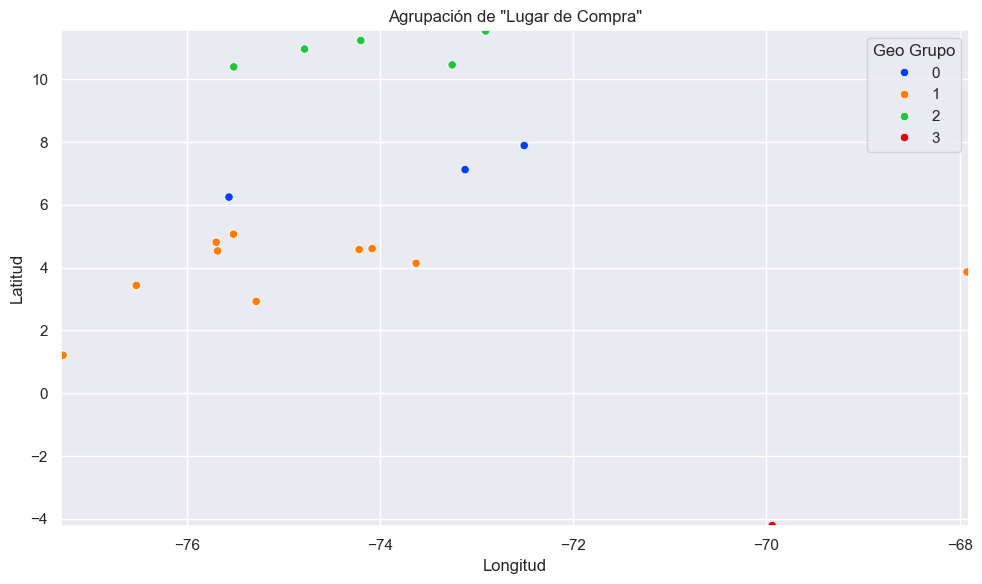

In [91]:
# Crear figura que contendrá el gráfico
plt.figure(figsize=(10, 6))

# Crear el grafico de puntos con valores de latitud y longitud, diferenciado por colores con los grupos obtenidos de KMeans
sns.scatterplot(data=x, x='lon', y='lat', hue='Geo Grupo', palette='bright')

#Configurariones adicionales
plt.title('Agrupación de "Lugar de Compra"')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.xlim(min_lon-0.02, max_lon+0.02)
plt.ylim(min_lat-0.02, max_lat+0.02)
plt.grid(True)
plt.tight_layout()

# Mostrar el gráfico
plt.show()

#### Observaciones - Análisis Geográfico de Ventas

Es posible observar que la agrupación en 4 grupos no parece ser la ideal. Esto se debe a los dos puntos que se encuentran sobre los márgenes derecho e inferior, considerados outliers, que estan afectando la agrupación geográfica, por lo que haré un filtro y estos dos puntos se tratarán de forma separada.


In [92]:
# Eliminar ubicación demasiado alejada para evitar sesgo
ubicacion_clientes_no_ol = ubicacion_clientes.copy()
ubicacion_clientes_no_ol = ubicacion_clientes_no_ol.drop('Tienda', axis=1)
ubicacion_clientes_no_ol = ubicacion_clientes_no_ol[ubicacion_clientes_no_ol['lon'] <= -72].reset_index(drop=True)

In [93]:
# Generar un nuevo modelo sin outliers
kmeans_no_outliers = KMeans(3)
kmeans_no_outliers.fit(ubicacion_clientes_no_ol)

KMeans(n_clusters=3)

In [94]:
# Agregar columna con las etiquetas de clusters obtenidos
ubicacion_clientes_no_ol['Geo Grupo'] = kmeans_no_outliers.predict(ubicacion_clientes_no_ol[['lat', 'lon']])

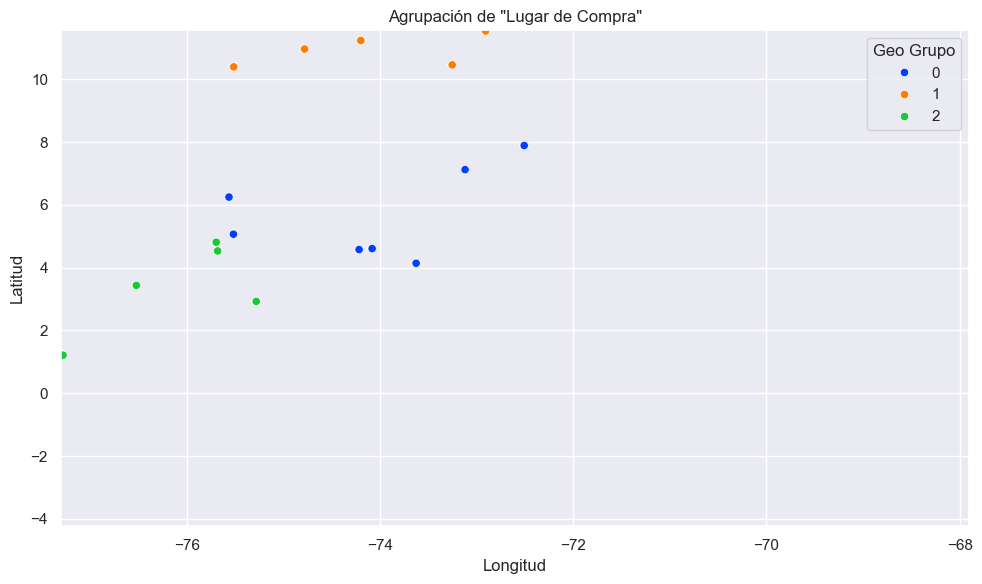

In [95]:
# Generar nuevo gráfico de puntos para visualizar la clusterización
plt.figure(figsize=(10, 6))
sns.scatterplot(data=ubicacion_clientes_no_ol, x='lon', y='lat', hue='Geo Grupo', palette='bright')
plt.title('Agrupación de "Lugar de Compra"')
plt.xlabel('Longitud')
plt.ylabel('Latitud')
plt.xlim(min_lon-0.02, max_lon+0.02)
plt.ylim(min_lat-0.02, max_lat+0.02)
plt.grid(True)
plt.tight_layout()
plt.show()

#### Observaciones - Análisis Geográfico de Ventas

La clusterización de KMeans es inconsistente, inicialmente los grupos estaban distribuidos entre:<br>

* Grupo 0: Puntos que se encuentran al norte, por encima de **latitud = 10**
* Grupo 1: Puntos en **latitud = [4, 8]** y **longitud = [-75, -72]**
* Grupo 2: Puntos en **latitud = [1, 7]** y **longitud = [-78, -75]**

Pero esta clusterización arroja resultados distintos cada vez que se ejecuta. Por lo cual optaré por otro método.

In [96]:
# Crear un diccinario que almacenara los registros por lugar de compra
lugares_compras = {}

#Iterar sobre los dataframes
for i, df in enumerate(dfs_costoenvio):
    # Contar la cantidad de productos vendidos en cada 'Lugar de Compra'
    cantidad_productos = df.groupby('Lugar de Compra')['Lugar de Compra'].value_counts()
    for item in cantidad_productos.items():
        # Agregar la clave con el lugar de compra si no existe en el diccionario general con la tienda y su venta
        if item[0] not in lugares_compras:
            lugares_compras[item[0]] = {}
            lugares_compras[item[0]][nombres[i]] = item[1]
        # Si ya existe el lugar de compra en el diccionario, agregar la venta de la tienda correspondiente en tal lugar
        else:
            lugares_compras[item[0]][nombres[i]] = item[1]

In [97]:
# Crear el DataFrame con los valores obtenidos en las iteraciones anteriores, agregar total de compras por ciudad, y ordenar de menor a mayor
df_lugares_compras = pd.DataFrame.from_dict(lugares_compras, orient='index')
df_lugares_compras['Total Compras'] = df_lugares_compras.apply(lambda row: int(row.sum()), axis=1)
df_lugares_compras.sort_values(by='Total Compras', ascending=False)

,Tienda 1,Tienda 2,Tienda 3,Tienda 4,Total Compras
Bogotá,984,985,983,991,3943
Medellín,563,594,580,577,2314
Cali,283,222,248,254,1007
Pereira,133,128,134,122,517
Barranquilla,75,78,77,80,310
Cartagena,53,70,56,63,242
Cúcuta,51,59,44,32,186
Bucaramanga,31,50,50,50,181
Riohacha,40,35,44,44,163
Santa Marta,32,40,44,35,151


## 6. Análisis Geoespacial

En este apartado se analizarán los aspectos de **facturación** y **calificación de los clientes** en relación con su **ubicación geográfica**.

Para comenzar, se unificará la información de todas las tiendas en un único DataFrame *(tabla)* para obtener una visión general, y posteriormente se explorarán las **características individuales de cada tienda** mediante visualizaciones segmentadas.

El análisis buscará responder preguntas como:

* ¿Dónde se concentra el volumen de ventas?
* ¿Existen regiones o ciudades con calificaciones promedio más altas o más bajas?
* ¿Se pueden identificar patrones geográficos que influyan en la percepción del cliente?

A modo de hipótesis exploratoria, se propondrá la creación de un **mapa individual por tienda**, con el objetivo de identificar posibles variaciones regionales en la calificación promedio. Dado que no se cuenta con información explícita sobre la ubicación física de las tiendas, este enfoque podría ofrecer indicios indirectos sobre su localización, considerando que los clientes menos satisfechos podrían estar ubicados a mayor distancia de la tienda donde realizaron la compra.

### Análisis general

In [98]:
# Checkpoints para el Análisis Geoespacial
df_geoanalisis_tienda1 = df_tienda1.copy()
df_geoanalisis_tienda2 = df_tienda2.copy()
df_geoanalisis_tienda3 = df_tienda3.copy()
df_geoanalisis_tienda4 = df_tienda4.copy()

In [99]:
# Agregar etiqueta a cada registro de la tienda correspondiente para poder unificar
df_geoanalisis_tienda1['Tienda'] = 'Tienda 1'
df_geoanalisis_tienda2['Tienda'] = 'Tienda 2'
df_geoanalisis_tienda3['Tienda'] = 'Tienda 3'
df_geoanalisis_tienda4['Tienda'] = 'Tienda 4'

In [100]:
# Unificar los DataFrames
df_total = pd.concat([df_geoanalisis_tienda1,
                      df_geoanalisis_tienda2,
                      df_geoanalisis_tienda3,
                      df_geoanalisis_tienda4],
                    ignore_index=True)

In [101]:
df_total.head(0)

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon,Año-Mes,Tienda


In [102]:
# Descartar columnas no necesarias para el análisis en curso
df_total = df_total.drop(['Producto', 'Categoría del Producto', 'Fecha de Compra', 'Vendedor',
                          'Método de pago', 'Cantidad de cuotas', 'Año-Mes'], 
                         axis=1)
df_total.head()

,Precio,Costo de envío,Lugar de Compra,Calificación,lat,lon,Tienda
0,164300.0,6900.0,Bogotá,4,4.60971,-74.08175,Tienda 1
1,192300.0,8400.0,Medellín,1,6.25184,-75.56359,Tienda 1
2,209600.0,15900.0,Cartagena,1,10.39972,-75.51444,Tienda 1
3,757500.0,41000.0,Cali,4,3.43722,-76.52250,Tienda 1
4,335200.0,20200.0,Medellín,5,6.25184,-75.56359,Tienda 1


In [103]:
# Comprobar tipos de datos y valores nulos
df_total.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9435 entries, 0 to 9434
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Precio           9435 non-null   float64
 1   Costo de envío   9435 non-null   float64
 2   Lugar de Compra  9435 non-null   object 
 3   Calificación     9435 non-null   int64  
 4   lat              9435 non-null   float64
 5   lon              9435 non-null   float64
 6   Tienda           9435 non-null   object 
dtypes: float64(4), int64(1), object(2)
memory usage: 516.1+ KB


In [104]:
# Agrupar por 'Lugar de Compra' y obtener la venta total en cada uno de ellos
sumatoria_ventas_ciudad = df_total.groupby(['Lugar de Compra', 'lat', 'lon'])['Precio'].sum().reset_index()
sumatoria_ventas_ciudad.sort_values(by='Precio', ascending=False)

,Lugar de Compra,lat,lon,Precio
2,Bogotá,4.60971,-74.08175,1.814858e+09
10,Medellín,6.25184,-75.56359,1.096669e+09
4,Cali,3.43722,-76.52250,5.065261e+08
13,Pereira,4.81333,-75.69611,2.259273e+08
1,Barranquilla,10.96854,-74.78132,1.320405e+08
5,Cartagena,10.39972,-75.51444,1.023767e+08
6,Cúcuta,7.89391,-72.50782,9.936910e+07
3,Bucaramanga,7.12539,-73.11980,9.057330e+07
14,Riohacha,11.54444,-72.90722,7.387970e+07
8,Leticia,-4.21528,-69.94056,6.714990e+07


In [105]:
# Agrupar por 'Lugar de Compra' y obtener la calificación promedio en cada uno de ellos
calificaciones_ciudad = df_total.groupby('Lugar de Compra')[['lat', 'lon', 'Calificación']].mean().reset_index()
calificaciones_ciudad['Calificación'] = round(calificaciones_ciudad['Calificación'], 2)
calificaciones_ciudad.sort_values(by='Calificación', ascending=False)

,Lugar de Compra,lat,lon,Calificación
12,Pasto,1.21361,-77.28111,4.15
2,Bogotá,4.60971,-74.08175,4.11
17,Valledupar,10.46314,-73.25322,4.07
4,Cali,3.43722,-76.52250,4.05
5,Cartagena,10.39972,-75.51444,4.02
13,Pereira,4.81333,-75.69611,4.01
3,Bucaramanga,7.12539,-73.11980,3.98
6,Cúcuta,7.89391,-72.50782,3.94
10,Medellín,6.25184,-75.56359,3.93
8,Leticia,-4.21528,-69.94056,3.92


#### Mapa de marcadores general

In [106]:
# Diccionario que contiene los colores asignados para los marcadores de cada tienda
icon_colors = {
            'Tienda 1': 'blue',
            'Tienda 2': 'red',
            'Tienda 3': 'orange',
            'Tienda 4': 'green'
        }

In [107]:
# Generar mapa de marcadores
folium_map(df_total,
           tipo='marker',
           columnas=['Precio', 'Calificación'],
           diccionario_colores=icon_colors)

#### Mapa de calor general

In [108]:
# Generar mapa de calor de Facturación general
folium_map(sumatoria_ventas_ciudad,
           tipo='heatmap',
           columnas=['Precio'])

In [109]:
# Generar mapa de calor de Calificación Promedio general
folium_map(calificaciones_ciudad,
           tipo='heatmap',
           columnas=['Calificación'])

#### Observaciones iniciales - Análisis Geoespacial General:

*Nota: Para poder distinguir las distintas intensidades en los casos particulares o agrupados, es necesario manipular el zoom del mapa para visualizar correctamente el peso otorgado a cada región o ciudad.*

***Facturación:***

Como se puede observar en el mapa de calor *(HeatMap)*, la ciudad con mayor facturación es **Bogotá**, seguida por **Medellín** y **Santiago de Cali** en tercer lugar si analizamos ciudades individuales.<br>

En el área de la *costa norte* donde se encuentran **Valledupar, Cartagena de Indias, Barranquilla, Santa Marta y Riohacha**. La primera presenta una cantidad de ventas muy pequeña, se puede apreciar que donde más venden las tiendas es en las ciudades costeras

De esta manera, podemos quizas agrupar la ubucación de los clientes de la siguiente manera:

* *Zona Capital:* **Bogotá, Soacha, Villavicencio**
* *Zona Andina:* **Medellín, Manizales, Pereira, Armenia, Santiago de Cali, Neiva, Pasto**
* *Zona Costa Norte:* **Valledupar, Cartagena de Indias, Barranquilla, Santa Marta y Riohacha**
* *Otras:* **Cúcuta, Bucaramanga, Inírida, Leticia**

***Calificación:***

En cuanto a las calificaciones, una vez más vemos que **Bogotá** presenta un buen promedio, sin embargo, en este aspecto es superada por **Pasto**.<br>

* En la *Zona Capital* solo se presenta un buen promedio de satisfacción del cliente en la ciudad de **Bogotá**. Esto puede deberse a una gran demanda dentro de la capital, y que esto perjudique la atención hacia las ciudades más pequeñas que se encuentran en su perisferia.

* **Santiago de Cali** y **Pereira** presentan un buen promedio de calificación, mientras que las otras ciudades que clasifiqué anteriormente como parte de la *Zona Andina* no muestran un buen promedio en cuanto a la satisfacción de los clientes.<br>

* En la *Zona Costa Norte*, **Cartagena de Indias** y **Valledupar** presentan el mejor promedio de la zona, mientras que el resto de ciudades no posee una buena calificación, aún cuando las distancias no son grandes entre ellas. Es recomendable analizar este caso en particular para entender cuáles son las razones por las que existe esta diferencia tan marcada dentro de la zona.

* Por ultimo, a las ciudades agrupadas dentro de la categoría *Otras*, **Bucaramanga** y **Cúcuta** presentan una calificación promedio estándar mientras que **Inírida** y **Leticia** muestran un promedio de calificación relativamente bajo, probablemente debido a su lejanía. Aquí es interesante destacar que **Leticia** pese a ser la ciudad más alejada de las capitales, tiene una venta similar a algunas ciudades costeras y céntricas.

***Algunas consideraciones con respecto a este análisis inicial:***

* El volumen de ventas podría ser considerado al evaluar las calificaciones de los clientes para entender mejor este fenómeno, ya que debido a que el promedio esta calculado sobre el valor absoluto, no se tiene en cuenta el peso del volumen de ventas con respecto a la cantidad de calificaciones, por lo que, **Pasto** al tener menor volumen de ventas, corre con cierta ventaja ya que la cantidad de reseñas tambien es menor, lo que hace que el sea más probable que su promedio sea alto.

* Para poder entender mejor las razones subyacentes de las 'Calificaciones', resultaría necesario contar con mayor información como la ubicación de cada una de las tiendas, tiempo de entrega desde la compra, ubicaciones más precisas de cada cliente.

  Con la información aquí presente, se abordará un análisis de estos aspectos en cada una de las tiendas de forma individual para inferir la posible ubicación de las mismas y evaluar como esto puede estar afectando a la satisfacción de los clientes.

### Análisis segmentado por ciudad y tienda

*Nota: En la segmentación, se iniciará con agrupar los valores de cada tienda y aplicar la función de agregación correspondiente, para luego generar los mapas correspondientes. Cada apartado tiene su propio subtitulo para diferenciación.*

#### Tienda 1

In [110]:
"""
geo_facturacion_tienda1 = df_geoanalisis_tienda1.groupby(['Lugar de Compra', 'lat', 'lon'])['Precio'].sum().reset_index()
geo_calificaciones_tienda1 = df_geoanalisis_tienda1.groupby(['Lugar de Compra', 'lat', 'lon'])['Calificación'].mean().reset_index()
"""

"\ngeo_facturacion_tienda1 = df_geoanalisis_tienda1.groupby(['Lugar de Compra', 'lat', 'lon'])['Precio'].sum().reset_index()\ngeo_calificaciones_tienda1 = df_geoanalisis_tienda1.groupby(['Lugar de Compra', 'lat', 'lon'])['Calificación'].mean().reset_index()\n"

***Mapa de Marcadores - Facturación por Ciudad - Tienda 1***

In [111]:
"""
folium_map(df_geoanalisis_tienda1,
           tipo='marker',
           columnas=['Precio'],
          diccionario_colores=icon_colors)
          """

"\nfolium_map(df_geoanalisis_tienda1,\n           tipo='marker',\n           columnas=['Precio'],\n          diccionario_colores=icon_colors)\n          "

##### ***Mapa de Calor - Facturación por Ciudad - Tienda 1***

In [112]:
"""
folium_map(geo_facturacion_tienda1,
           tipo='heatmap',
           columnas=['Precio'])
"""

"\nfolium_map(geo_facturacion_tienda1,\n           tipo='heatmap',\n           columnas=['Precio'])\n"

##### ***Mapa de Calor - Calificación Promedio por Ciudad - Tienda 1***

In [113]:
"""
folium_map(geo_calificaciones_tienda1,
           tipo='heatmap',
           columnas=['Calificación'])
"""

"\nfolium_map(geo_calificaciones_tienda1,\n           tipo='heatmap',\n           columnas=['Calificación'])\n"

#### Tienda 2

In [114]:
"""
geo_facturacion_tienda2 = df_geoanalisis_tienda2.groupby(['Lugar de Compra', 'lat', 'lon'])['Precio'].sum().reset_index()
geo_calificaciones_tienda2 = df_geoanalisis_tienda2.groupby(['Lugar de Compra', 'lat', 'lon'])['Calificación'].mean().reset_index()
"""

"\ngeo_facturacion_tienda2 = df_geoanalisis_tienda2.groupby(['Lugar de Compra', 'lat', 'lon'])['Precio'].sum().reset_index()\ngeo_calificaciones_tienda2 = df_geoanalisis_tienda2.groupby(['Lugar de Compra', 'lat', 'lon'])['Calificación'].mean().reset_index()\n"

***Mapa de Marcadores - Facturación por Ciudad - Tienda 2***

In [115]:
"""folium_map(df_geoanalisis_tienda2,
           tipo='marker',
           columnas=['Precio'],
          diccionario_colores=icon_colors)
"""

"folium_map(df_geoanalisis_tienda2,\n           tipo='marker',\n           columnas=['Precio'],\n          diccionario_colores=icon_colors)\n"

##### ***Mapa de Calor - Facturación por Ciudad - Tienda 2***

In [116]:
"""
folium_map(geo_facturacion_tienda2,
           tipo='heatmap',
           columnas=['Precio'])
"""

"\nfolium_map(geo_facturacion_tienda2,\n           tipo='heatmap',\n           columnas=['Precio'])\n"

##### ***Mapa de Calor - Calificación Promedio por Ciudad - Tienda 2***

In [117]:
"""
folium_map(geo_calificaciones_tienda2,
           tipo='heatmap',
           columnas=['Calificación'])
"""

"\nfolium_map(geo_calificaciones_tienda2,\n           tipo='heatmap',\n           columnas=['Calificación'])\n"

#### Tienda 3

In [118]:
"""
geo_facturacion_tienda3 = df_geoanalisis_tienda3.groupby(['Lugar de Compra', 'lat', 'lon'])['Precio'].sum().reset_index()
geo_calificaciones_tienda3 = df_geoanalisis_tienda3.groupby(['Lugar de Compra', 'lat', 'lon'])['Calificación'].mean().reset_index()
"""

"\ngeo_facturacion_tienda3 = df_geoanalisis_tienda3.groupby(['Lugar de Compra', 'lat', 'lon'])['Precio'].sum().reset_index()\ngeo_calificaciones_tienda3 = df_geoanalisis_tienda3.groupby(['Lugar de Compra', 'lat', 'lon'])['Calificación'].mean().reset_index()\n"

***Mapa de Marcadores - Facturación por Ciudad - Tienda 3***

In [119]:
"""
folium_map(df_geoanalisis_tienda3,
           tipo='marker',
           columnas=['Precio'],
          diccionario_colores=icon_colors)
"""

"\nfolium_map(df_geoanalisis_tienda3,\n           tipo='marker',\n           columnas=['Precio'],\n          diccionario_colores=icon_colors)\n"

##### ***Mapa de Calor - Facturación por Ciudad - Tienda 3***

In [120]:
"""
folium_map(geo_facturacion_tienda3,
           tipo='heatmap',
           columnas=['Precio'])
"""

"\nfolium_map(geo_facturacion_tienda3,\n           tipo='heatmap',\n           columnas=['Precio'])\n"

##### ***Mapa de Calor - Calificación Promedio por Ciudad - Tienda 3***

In [121]:
"""
folium_map(geo_calificaciones_tienda3,
           tipo='heatmap',
           columnas=['Calificación'])
"""

"\nfolium_map(geo_calificaciones_tienda3,\n           tipo='heatmap',\n           columnas=['Calificación'])\n"

#### Tienda 4

In [122]:
"""
geo_facturacion_tienda4 = df_geoanalisis_tienda4.groupby(['Lugar de Compra', 'lat', 'lon','Tienda'])['Precio'].sum().reset_index()
geo_calificaciones_tienda4 = df_geoanalisis_tienda4.groupby(['Lugar de Compra', 'lat', 'lon'])['Calificación'].mean().reset_index()
"""

"\ngeo_facturacion_tienda4 = df_geoanalisis_tienda4.groupby(['Lugar de Compra', 'lat', 'lon','Tienda'])['Precio'].sum().reset_index()\ngeo_calificaciones_tienda4 = df_geoanalisis_tienda4.groupby(['Lugar de Compra', 'lat', 'lon'])['Calificación'].mean().reset_index()\n"

***Mapa de Marcadores - Facturación por Ciudad - Tienda 4***

In [123]:
"""
folium_map(df_geoanalisis_tienda4,
           tipo='marker',
           columnas=['Precio'],
          diccionario_colores=icon_colors)
"""

"\nfolium_map(df_geoanalisis_tienda4,\n           tipo='marker',\n           columnas=['Precio'],\n          diccionario_colores=icon_colors)\n"

##### ***Mapa de Calor - Facturación por Ciudad - Tienda 4***

In [124]:
"""
folium_map(geo_facturacion_tienda4,
           tipo='heatmap',
           columnas=['Precio'],
          diccionario_colores=icon_colors)
"""

"\nfolium_map(geo_facturacion_tienda4,\n           tipo='heatmap',\n           columnas=['Precio'],\n          diccionario_colores=icon_colors)\n"

##### ***Mapa de Calor - Calificación Promedio por Ciudad - Tienda 4***

In [125]:
"""
folium_map(geo_calificaciones_tienda4,
           tipo='heatmap',
           columnas=['Calificación'])
"""

"\nfolium_map(geo_calificaciones_tienda4,\n           tipo='heatmap',\n           columnas=['Calificación'])\n"

#### Observaciones - Análisis Geoespacial segmentado por ciudad y tienda

A partir del análisis de la **Facturación y Calificación promedio segmentado por ciudad y tienda**, no me ha sido posible inferir la ubicación de cada una de ellas, ya que la **facturación** es predominante en **Bogotá** en todas ellas, mientras que el **promedio de calificación de los clientes** varía principalmente entre **Bogotá** y **Valledupar**.

Debido a esto señor Juan, sugiero encarecidamente que se realice un **análisis detallado de la distribución geográfica** tanto de las **tiendas** como de **clientes**, con el objetivo de **mejorar la logística** de la empresa y mejorar así **la experiencia de los clientes**, esto traerá mayor estabilidad y salud económica al negocio, así como también podría generar un impacto en la captación de nuevos clientes.

## 7. Conclusiones y recomendación

#### Resumen del análisis - Formato tabular

In [126]:
resumen_analisis = [
    
    {'Análisis': 'Facturación',
     'Conclusión principal': 'Tienda 1 lidera en ingresos; Tienda 4 queda última',	
     'Acción sugerida / Nota clave': 'Profundizar en causas de baja facturación en Tienda 4'},
    
    {'Análisis': 'Ventas por categoría',
     'Conclusión principal': 'Distribución equilibrada entre tiendas',	
     'Acción sugerida / Nota clave': 'No es un factor clave para decidir qué tienda vender'},
    
    {'Análisis': 'Categorías poco vendidas'	,
     'Conclusión principal': '4 categorías suman solo ~7% del total',	
     'Acción sugerida / Nota clave': 'Analizar márgenes y costos logísticos para evaluar continuidad'},
    
    {'Análisis': 'Calificación promedio',
     'Conclusión principal': 'Tienda 1 tiene la calificación más baja',	
     'Acción sugerida / Nota clave': 'Podría estar relacionada con sobrecarga operativa'},
    
    {'Análisis': 'Productos menos vendidos',
     'Conclusión principal': 'Algunos productos de bajo volumen aportan buenos ingresos',	
     'Acción sugerida / Nota clave': 'Evaluar márgenes y rotación antes de discontinuarlos'},
    
    {'Análisis': 'Productos más vendidos',
     'Conclusión principal': 'Muebles y Electrodomésticos (como conjunto) dominan en volumen e ingresos',
     'Acción sugerida / Nota clave': 'Potenciar con promociones y campañas de marketing'},
    
    {'Análisis': 'Costo de envío',
     'Conclusión principal': 'Relación directa con nivel de ventas',	
     'Acción sugerida / Nota clave': 'Optimizar logística, no usar como factor de decisión de venta'},
    
    {'Análisis': 'Análisis geoespacial',
     'Conclusión principal': 'No se infiere ubicación real; Bogotá domina en ventas',	
     'Acción sugerida / Nota clave': 'Necesario analizar ubicación física de tiendas y clientes'},
    
]
		
df_resumen = pd.DataFrame(resumen_analisis)

pd.set_option('display.max_colwidth', None)
from IPython.display import display

display(df_resumen.style.hide(axis="index"))

Análisis,Conclusión principal,Acción sugerida / Nota clave
Facturación,Tienda 1 lidera en ingresos; Tienda 4 queda última,Profundizar en causas de baja facturación en Tienda 4
Ventas por categoría,Distribución equilibrada entre tiendas,No es un factor clave para decidir qué tienda vender
Categorías poco vendidas,4 categorías suman solo ~7% del total,Analizar márgenes y costos logísticos para evaluar continuidad
Calificación promedio,Tienda 1 tiene la calificación más baja,Podría estar relacionada con sobrecarga operativa
Productos menos vendidos,Algunos productos de bajo volumen aportan buenos ingresos,Evaluar márgenes y rotación antes de discontinuarlos
Productos más vendidos,Muebles y Electrodomésticos (como conjunto) dominan en volumen e ingresos,Potenciar con promociones y campañas de marketing
Costo de envío,Relación directa con nivel de ventas,"Optimizar logística, no usar como factor de decisión de venta"
Análisis geoespacial,No se infiere ubicación real; Bogotá domina en ventas,Necesario analizar ubicación física de tiendas y clientes


### Conclusiones


#### Extensión del Análisis:

Si se dispusiera de datos adicionales, podríamos enriquecer el análisis realizado en diversas direcciones:

* Evaluar el tiempo de entrega y el impacto que este tiene en la calificación del cliente.
* Mejorar el manejo de stock a partir de categorías y productos más vendidos, así como costos de almacenamientos.
* Determinar productos y/o categorías que podrían no ser rentables y potenciar aquellas que más lo son.
* Modelar predicciones de venta para decisiones de expansión del negocio y reducir los tiempos de entrega.

#### Resumen Ejecutivo Final

Después de analizar distintos aspectos del negocio, considero que los factores determinantes para decidir qué tienda vender son principalmente la **Facturación** y la **Calificación de los Clientes**.<br><br>

Observaciones sobre la tabla presentada:

* ***Tienda 1***: Es la tienda con **mayor facturación** de la empresa, pero también la que presenta la **peor calificación por parte de los clientes**. Es prioritario tomar medidas para mejorar la experiencia de compra en esta tienda, ya que su rentabilidad podría verse comprometida si el nivel de satisfacción no mejora.

* ***Tienda 2***: La **más estable** del negocio, ubicándose en segundo lugar tanto en facturación como en calificaciones. Este equilibrio refleja un sólido trabajo de sus equipos. Podría analizarse su funcionamiento en detalle para identificar buenas prácticas y **replicarlas en el resto de las tiendas**.

* ***Tienda 3***: Presenta una **facturación inestable**, con picos altos y bajos, pero se destaca por tener la **mejor calificación de los clientes**. Sería valioso investigar qué aspectos valoran más los clientes de esta tienda, y evaluar si estas fortalezas pueden convertirse en **estándares de servicio** para las demás.

* ***Tienda 4***:  Es la tienda con menor facturación y ocupa el tercer lugar en satisfacción del cliente. Habría que analizar si el bajo rendimiento es estructural o si puede mejorarse con intervenciones puntuales.


*Nota: Si bien Facturación y Calificación son los indicadores clave para tomar la decisión de venta, como se mencionó en ek apartado **Extensión del Análisis**, a lo largo del proceso fueron revelados otros aspectos del negocio que podrían **optimizarse para mejorar el rendimiento general**. Profundizar en estos puntos puede ayudar a una **mejor asignación de recursos** y a **maximizar los ingresos globales de la empresa**.*

In [127]:
df_ranking = pd.DataFrame.from_dict(ranking_final, orient='index')
df_ranking

,Facturación,Calificación Clientes
Tienda 1,1,4
Tienda 2,2,2
Tienda 3,3,1
Tienda 4,4,3


### Recomendación

Con la información extraida de este análisis señor Juan, la **Tienda 4** presenta la menor rentabilidad y no consigue una buena satisfacción del cliente, por lo que:

#### Mi recomendación es que se considere la *Tienda 4* para su venta y utilización del dinero para otras inversiones.